# Endometriosis - Clustering
# Nuclei

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import os
import sys

def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = '/nfs/team292/lg18/endometriosis/analysis_results/nuclei_only/epithelials/'
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

palette = ["#E31A1C", "#1F78B4", "#A6CEE3",  "#B2DF8A", "#33A02C", "#FB9A99",  "#FDBF6F", "#FF7F00", "#CAB2D6", "#6A3D9A", "#FFFF99", "#B15928", "#66C2A5",
               "#FC8D62", "#8DA0CB", "#B3B3B3", "#A6D854", "#FFD92F", "#E5C494", "#E78AC3"]


sys.executable

'/home/jovyan/my-conda-envs/sc_analysis/bin/python'

In [2]:
def cluster_small_multiples(adata, clust_key, size=10, frameon=False, legend_loc=None, **kwargs):
    tmp = adata.copy()

    for i, clust in enumerate(adata.obs[clust_key].cat.categories):
        tmp.obs[clust] = adata.obs[clust_key].isin([clust]).astype("category")
        tmp.uns[clust + "_colors"] = ["#d3d3d3", adata.uns[clust_key + "_colors"][i]]

    sc.pl.umap(
        tmp,
        groups=tmp.obs[clust].cat.categories[1:].values,
        color=adata.obs[clust_key].cat.categories.tolist(),
#         size=size,
        frameon=frameon,
        legend_loc=legend_loc,
        **kwargs,
    )

## Load data

In [3]:
path2datas = '/nfs/team292/lg18/endometriosis/integrated_objects/'
adata = sc.read(path2datas+'nuclei_epithelials_integrated.h5ad')
adata.X.shape

(162323, 33578)

In [4]:
adata.obs['Status'] = 'Control'
adata.obs.at[adata.obs['Group'] == 'Endo_Superficial', 'Status'] = 'Endometriosis'
# adata.obs.at[adata.obs['Binary Stage'] == 'Hormones', 'Status'] = 'Exogenous Hormones'
adata.obs['Status'].value_counts()

Endometriosis    122310
Control           40013
Name: Status, dtype: int64

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
... storing 'Status' as categorical


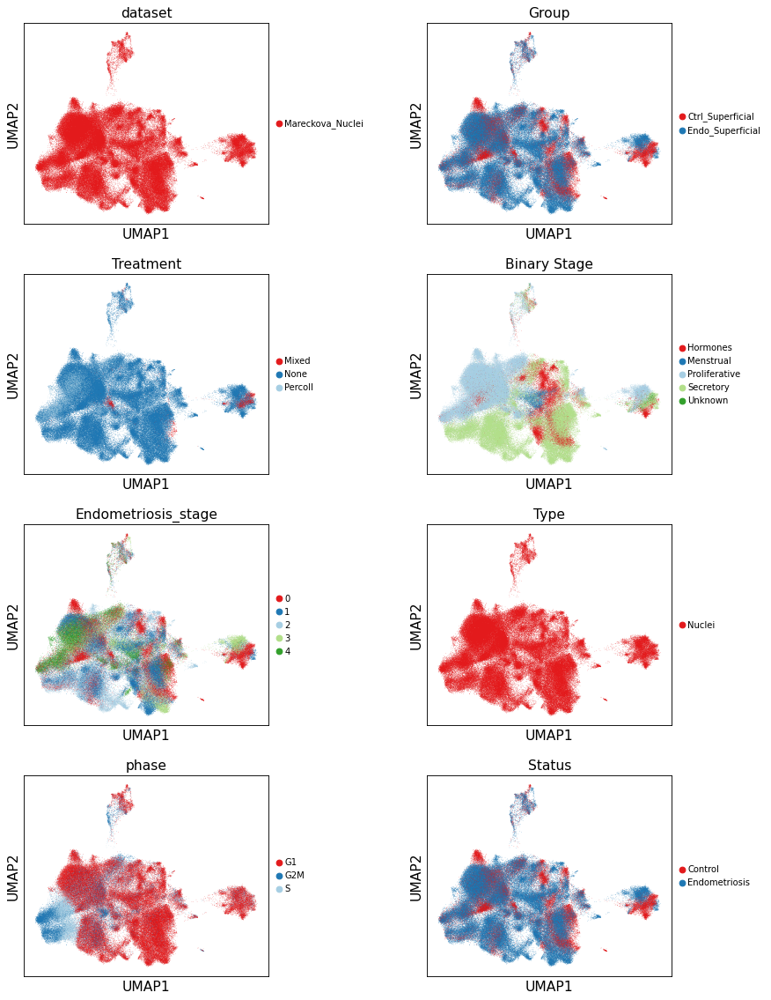

In [5]:
sc.pl.umap(sc.pp.subsample(adata, fraction=1, copy=True),
           color=['dataset', 'Group', 'Treatment', 'Binary Stage', 'Endometriosis_stage', 'Type', 'phase', 'Status'], 
           wspace=0.5, legend_fontsize=9, ncols=2, save='_metadata.pdf', palette=palette)

In [6]:
adata.obs.head()

,n_genes,sample,library,StudyName,SampleID,Lane,Processing,Type,BiopsyType,BiopsyType_II,...,S_score,G2M_score,phase,dataset,Nuc_celltype,LT_celltype,LT_epi_celltype,LT_mesen_celltype,Endometrial_pathology,Status
UA_Endo12269810_AACACACCACTTCAAG,4733,UA_Endo12269810_FX0033,UA_Endo12269810,Marecckovaa,UA_Endo12269810,43937.0,Frozen,Nuclei,Superficial,NaN,...,-0.214159,-0.119991,G1,Mareckova_Nuclei,Epi_preGlandular,preGlandular,preGlandular,NaN,E + A,Endometriosis
UA_Endo12061704_GACTGATAGCAGTACG,2887,UA_Endo12061704_FX1163,UA_Endo12061704,Marecckovaa,UA_Endo12061704,43281.0,Frozen,Nuclei,Superficial,NaN,...,-0.199468,-0.065523,G1,Mareckova_Nuclei,Epi_endocervix_MUC5B,MUC5B,MUC5B,NaN,E,Endometriosis
UA_Endo12061705_GGGTGTCAGGTGGCTA,2324,UA_Endo12061705_FX9009,UA_Endo12061705,Marecckovaa,UA_Endo12061705,43281.0,Frozen,Nuclei,Superficial,NaN,...,0.001900,-0.058076,S,Mareckova_Nuclei,Epi_Luminal,Hormones,Hormones,NaN,C,Control
UA_Endo12865963_GGGTGAATCCAGCTCT,3002,UA_Endo12865963_FX1087,UA_Endo12865963,Marecckovaa,UA_Endo12865963,44999.0,Frozen,Nuclei,Superficial,NaN,...,-0.138678,-0.102718,G1,Mareckova_Nuclei,Epi_Glandular,Glandular,Glandular,NaN,E,Endometriosis
UA_Endo10281925_ATGGAGGAGATGACCG,3031,UA_Endo10281925_FX1101,UA_Endo10281925,Marecckovaa,UA_Endo10281925,20.0,Frozen,Nuclei,Superficial,NaN,...,-0.040780,0.053125,G2M,Mareckova_Nuclei,Epi_SOX9,SOX9,SOX9,NaN,E + F,Endometriosis


In [7]:
# annot_df = pd.read_csv('/nfs/team292/lg18/endometriosis/annotations/nuclei_endometrium.csv',index_col=0)
# annot_df.index = [ a.replace('-'+b, '') for a, b in zip(annot_df.index, annot_df.Type.tolist())]
# annot_df.head()

# annot = annot_df['Nuc_celltype'].to_dict()
# adata.obs['Nuc_celltype'] = adata.obs_names.map(annot)
# print(adata.obs['Nuc_celltype'].value_counts())

In [8]:
annot_df = pd.read_csv('/nfs/team292/lg18/endometriosis/labelTransfer_cell2nuc/epithelial/transferred_labels.csv',index_col=0)
annot_df.head()
annot_epi = annot_df['classifier'].to_dict()


annot_df = pd.read_csv('/nfs/team292/lg18/endometriosis/labelTransfer_cell2nuc/mesenchymal/transferred_labels.csv',index_col=0)
annot_df.head()
annot_mesen = annot_df['classifier'].to_dict()

annot = dict(annot_epi)
annot.update(annot_mesen)


adata.obs['LT_celltype'] = adata.obs_names.map(annot)
print(adata.obs['LT_celltype'].value_counts())

adata.obs['LT_epi_celltype'] = adata.obs_names.map(annot_epi)
print(adata.obs['LT_epi_celltype'].value_counts())

adata.obs['LT_mesen_celltype'] = adata.obs_names.map(annot_mesen)
print(adata.obs['LT_mesen_celltype'].value_counts())

SOX9                        44144
preGlandular                22295
Glandular_secretory         18701
SOX9_luminal                17168
Hormones                    16003
Glandular                   13212
MUC5B                        9007
preLuminal                   6377
SOX9_basalis_II              5304
Luminal                      4489
Ciliated                     3136
SOX9_basalis_I                899
KRT5                          800
preCiliated                   334
Glandular_secretory_FGF7      231
Name: LT_celltype, dtype: int64
SOX9                        44144
preGlandular                22295
Glandular_secretory         18701
SOX9_luminal                17168
Hormones                    16003
Glandular                   13212
MUC5B                        9007
preLuminal                   6377
SOX9_basalis_II              5304
Luminal                      4489
Ciliated                     3136
SOX9_basalis_I                899
KRT5                          800
preCiliated     

... storing 'LT_celltype' as categorical
... storing 'LT_epi_celltype' as categorical
... storing 'Status' as categorical


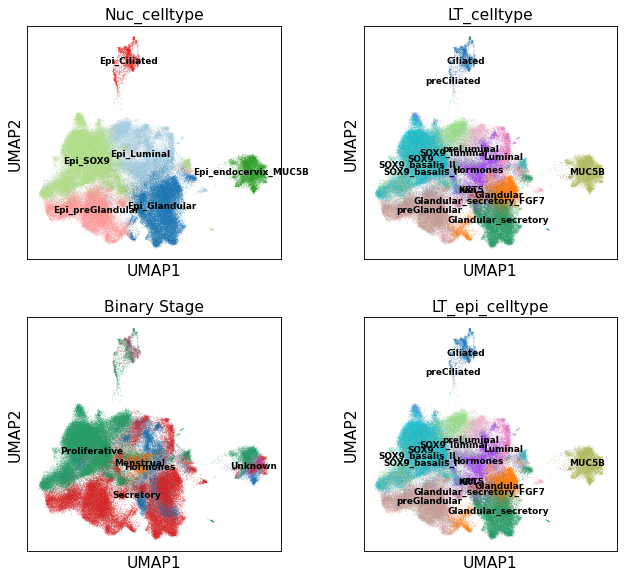

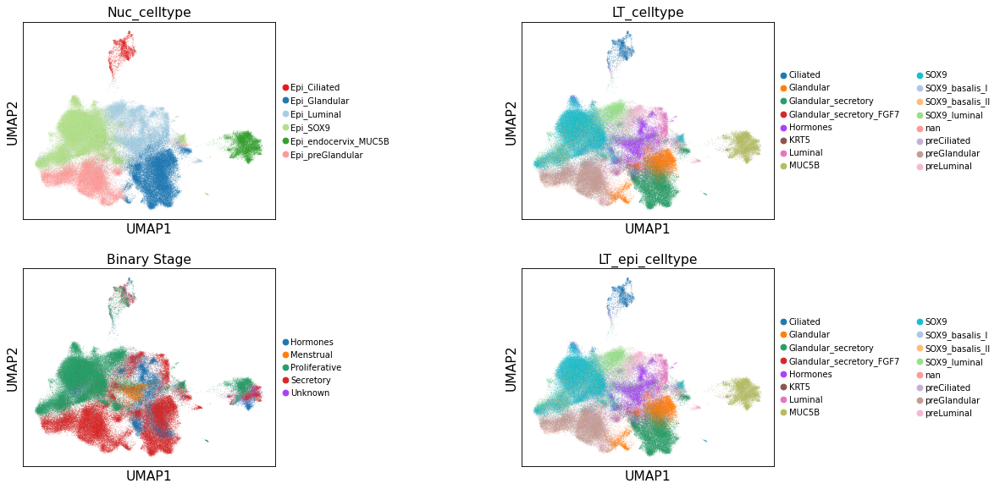

In [9]:
sc.pl.umap(adata, color=['Nuc_celltype', 'LT_celltype', 'Binary Stage', 'LT_epi_celltype'], ncols = 2, legend_loc='on data', legend_fontsize=8)
sc.pl.umap(adata, color=['Nuc_celltype', 'LT_celltype', 'Binary Stage', 'LT_epi_celltype'], ncols = 2, wspace=0.8, legend_fontsize=9)

... storing 'LT_celltype_long' as categorical


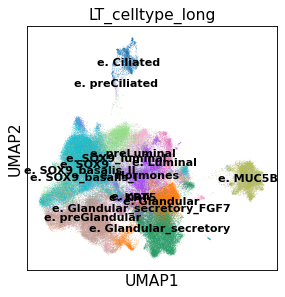

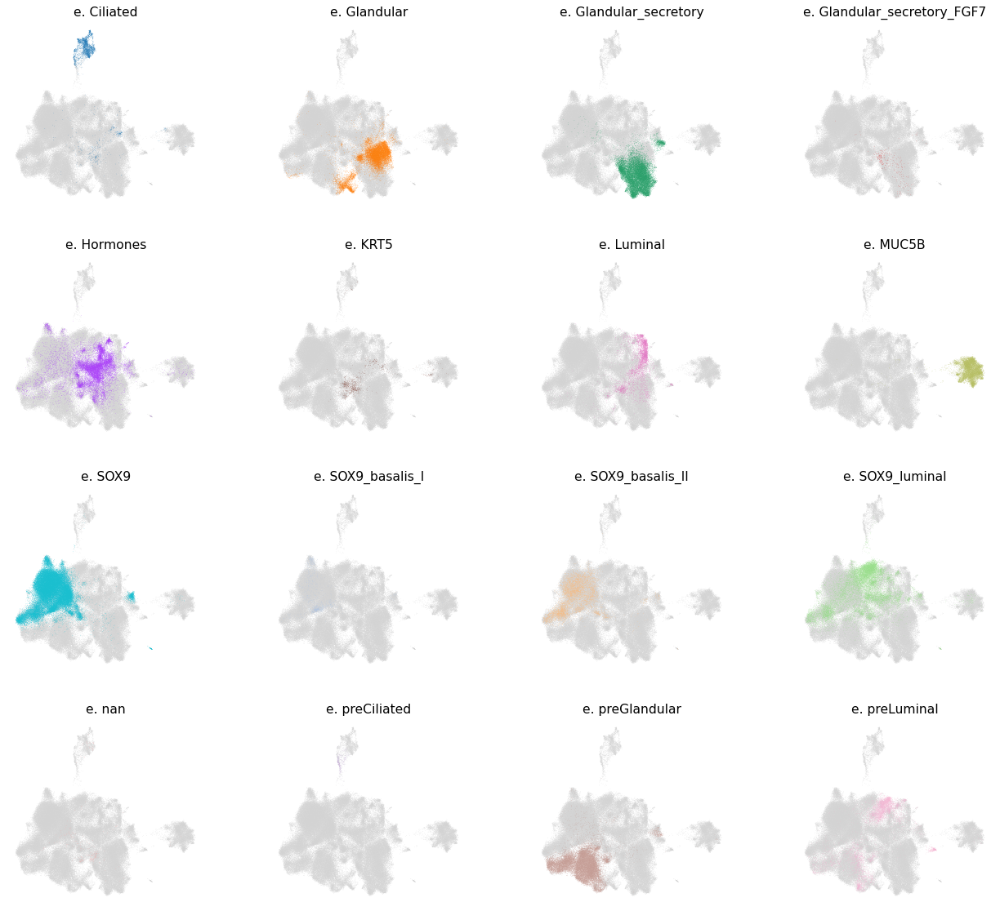

In [10]:
adata.obs['LT_celltype_long'] = ['e. ' + str(a) for a in adata.obs['LT_celltype'] ]
sc.pl.umap(adata, color=['LT_celltype_long'], frameon=True, legend_loc='on data', legend_fontsize=10)
cluster_small_multiples(adata, 'LT_celltype_long')

Glandular_secretory


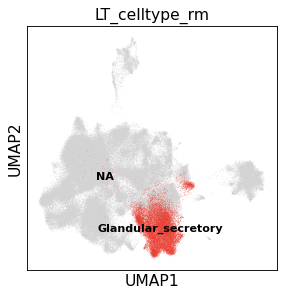

SOX9_basalis_II


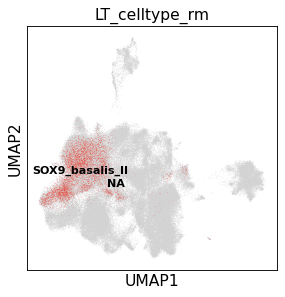

SOX9_luminal


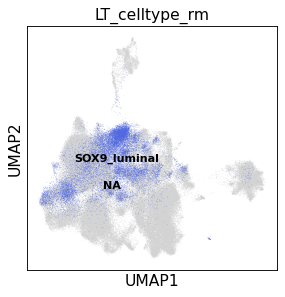

preLuminal


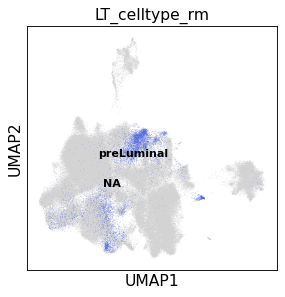

KRT5


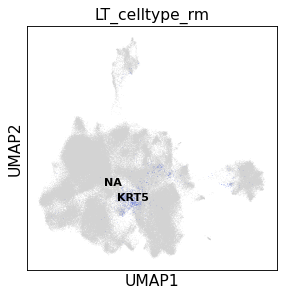

preGlandular


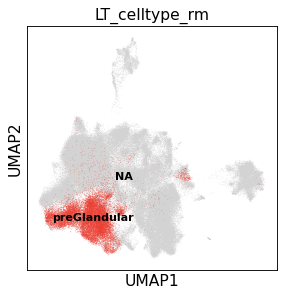

SOX9


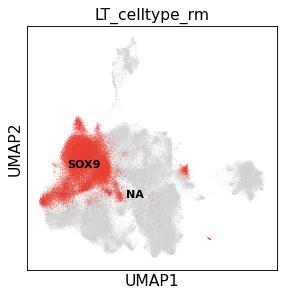

Glandular


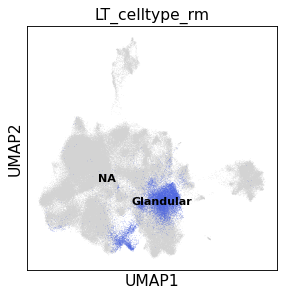

nan


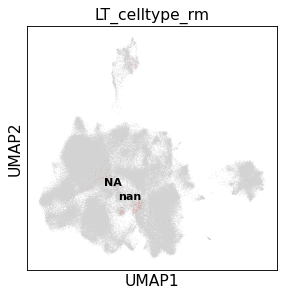

SOX9_basalis_I


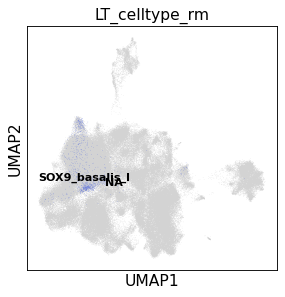

MUC5B


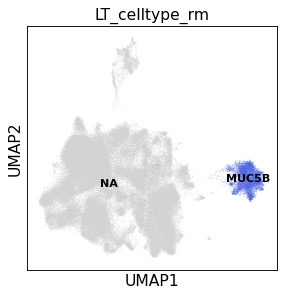

Hormones


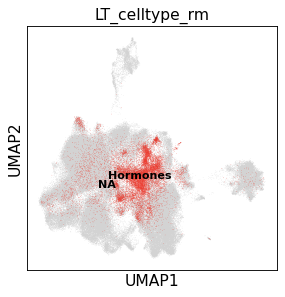

Glandular_secretory_FGF7


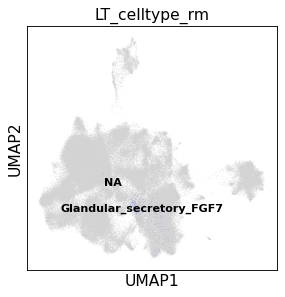

Luminal


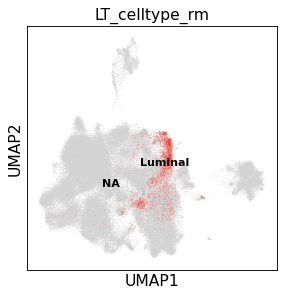

Ciliated


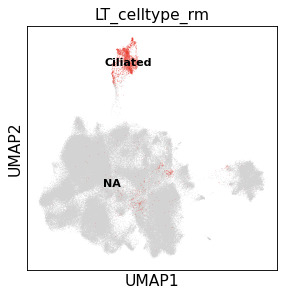

preCiliated


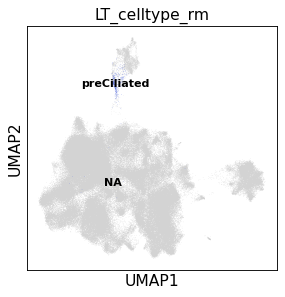

In [11]:
adata.obs['LT_celltype_rm'] = adata.obs.LT_celltype
for lin in set(adata.obs.LT_celltype):
    lin = str(lin)
    print(lin)
    sc.pl.umap(adata,
        groups=[lin],
        color=['LT_celltype_rm'],
        palette=['#eb4034', '#5169e0'],
        frameon=True, legend_loc='on data', legend_fontsize=10,
    )

## Clustering the graph
As Seurat and many others, we use the leiden graph-clustering method (community detection based on optimizing modularity). It has been proposed for single-cell data by Levine et al. (2015).

In [12]:
sc.tl.leiden(adata, resolution=0.75)

running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:32)


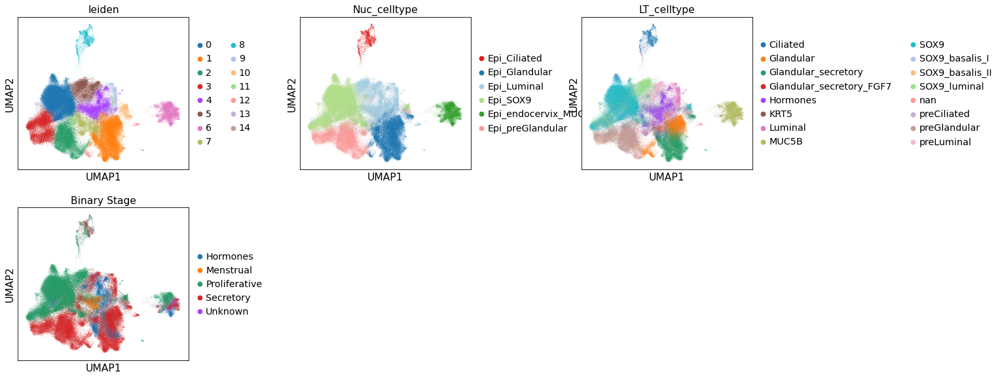

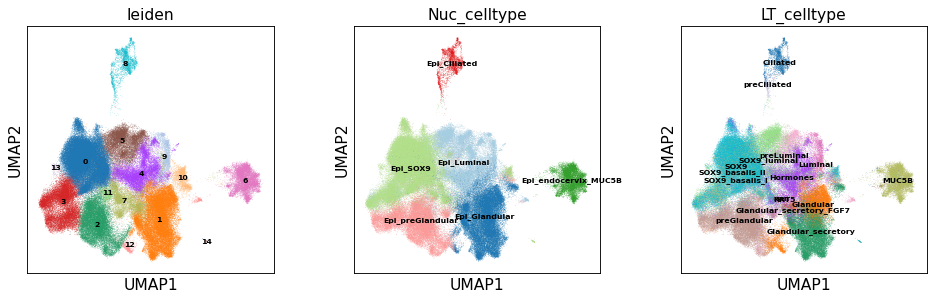

In [13]:
sc.pl.umap(adata, color=['leiden', 'Nuc_celltype', 'LT_celltype', 'Binary Stage'], wspace=0.5, ncols=3)
sc.pl.umap(adata, color=['leiden', 'Nuc_celltype', 'LT_celltype'],legend_loc='on data', legend_fontsize=7)

running Leiden clustering
    finished: found 19 clusters and added
    'leiden_R', the cluster labels (adata.obs, categorical) (0:00:06)


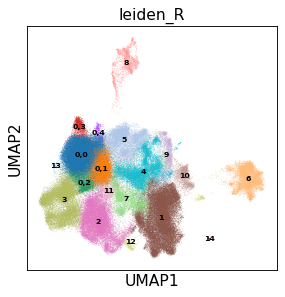

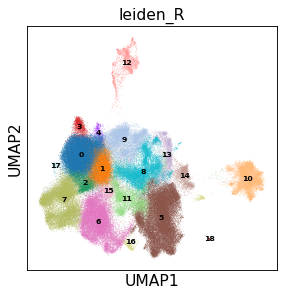

In [14]:
# split cluster
sc.tl.leiden(adata, resolution=0.5, restrict_to=('leiden', ['0']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=7)
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=7)
adata.obs['leiden'] = adata.obs['leiden_R']

running Leiden clustering
    finished: found 20 clusters and added
    'leiden_R', the cluster labels (adata.obs, categorical) (0:00:06)


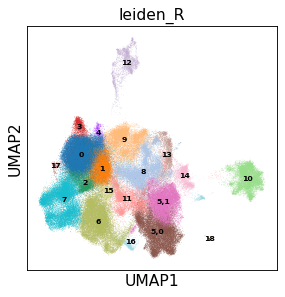

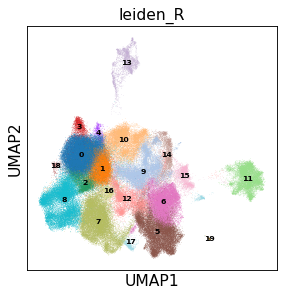

In [15]:
# split cluster
sc.tl.leiden(adata, resolution=0.25, restrict_to=('leiden', ['5']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=7)
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=7)
adata.obs['leiden'] = adata.obs['leiden_R']

running Leiden clustering
    finished: found 22 clusters and added
    'leiden_R', the cluster labels (adata.obs, categorical) (0:00:00)


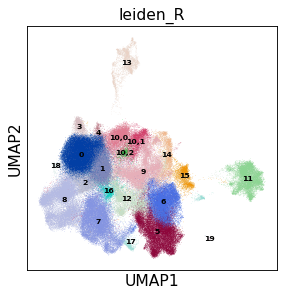

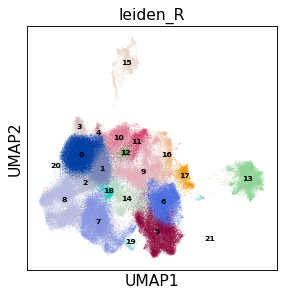

In [16]:
# split cluster
sc.tl.leiden(adata, resolution=0.2, restrict_to=('leiden', ['10']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=7)
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=7)
adata.obs['leiden'] = adata.obs['leiden_R']

running Leiden clustering
    finished: found 23 clusters and added
    'leiden_R', the cluster labels (adata.obs, categorical) (0:00:00)


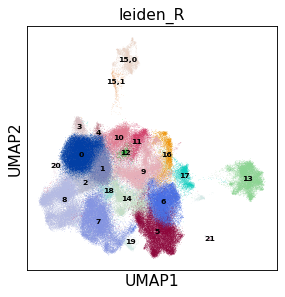

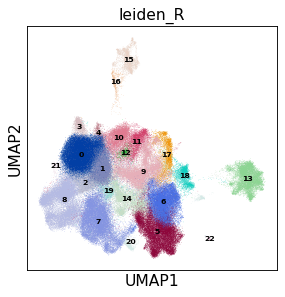

In [17]:
# split cluster
sc.tl.leiden(adata, resolution=0.1, restrict_to=('leiden', ['15']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=7)
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=7)
adata.obs['leiden'] = adata.obs['leiden_R']

### Visualize general markers

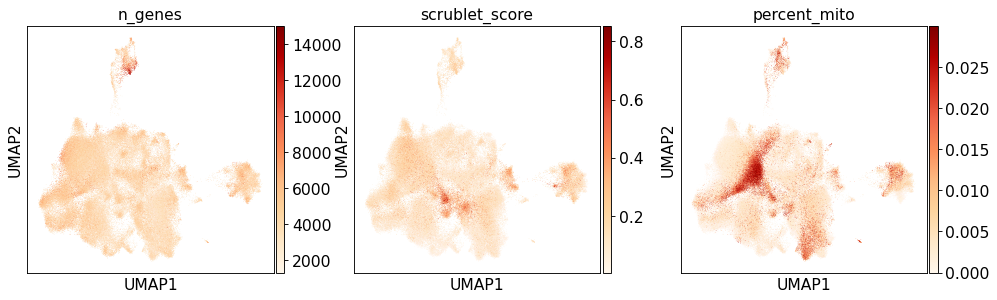

In [18]:
sc.pl.umap(adata, color=['n_genes','scrublet_score', 'percent_mito'], color_map='OrRd')

In [19]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

normalizing by total count per cell
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
    finished (0:00:08): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


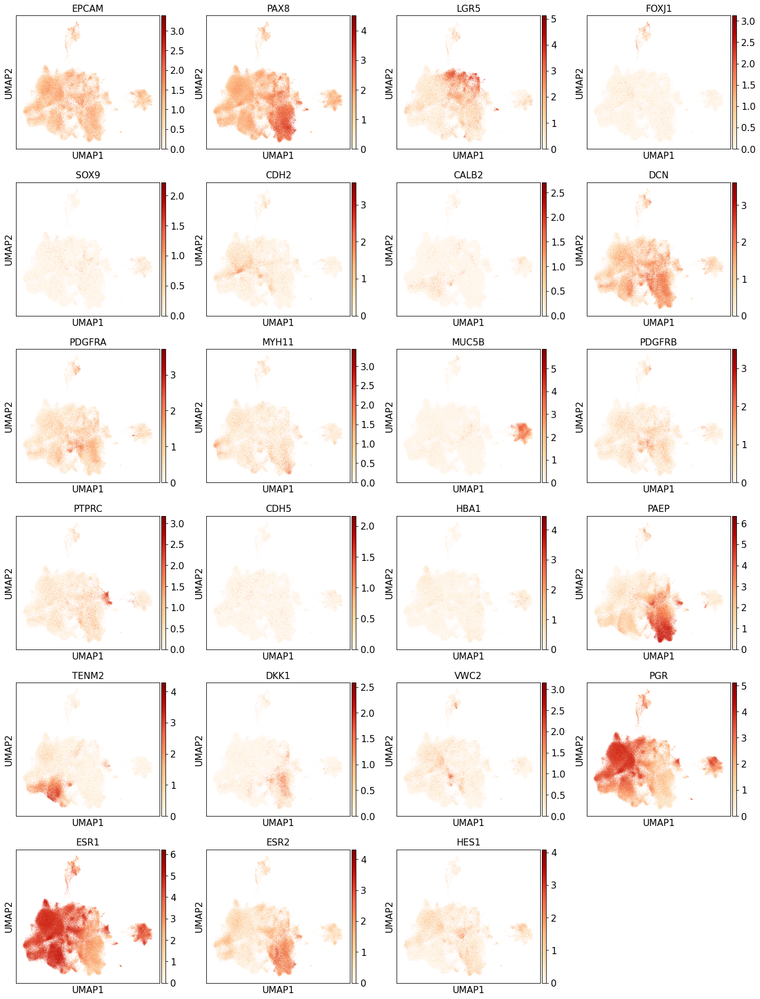

In [20]:
sc.pl.umap(adata, color=["EPCAM", "PAX8", 'LGR5', 'FOXJ1', 'SOX9', 'CDH2', 'CALB2',
                         "DCN", "PDGFRA",  "MYH11", 'MUC5B',
                         "PDGFRB", 'PTPRC', 'CDH5', 'HBA1', 'PAEP', 'TENM2', 'DKK1',  'VWC2', 'PGR', 'ESR1', 'ESR2', 'HES1'], color_map='OrRd', use_raw=False )

In [21]:
marker_genes = {
    'Epithelial lineage': {'EPCAM', 'PAX8'},
    'Follicular':{'MMP7'},
    'Luteal' :{'MT1M', 'CRYAB'},
    'Proliferative':{'IHH', "SPDEF", "TRH", "EMID1", "KMO", 'OVGP1', 'ADAMTS6', 'SOX17'},
    'SOX9':{'SOX9'},
    'Progenitor SOX9+/CDH2+':{'CDH2', 'KLK11', 'AXIN2', 'ALDH1A1'},
    'Prolif SOX9+':{'TRAF3IP3', 'BACH2', 'ZHX2', 'CCNA1', 'GLS', 'IGF2BP2',  'PLAU', 'CREB5'},
    'Prolif SOX9+/CDH2+':{'CDH2', 'PRDM1' ,'AREG', 'PHLDA1', 'SLC7A11', 'AQP3', 'DKK1'},
    'Prolif SOX9+/LGR5+':{'LGR5', 'WNT7A', 'TNF', 'CLDN22', 'CD109', 'EMILIN2', 'CXCL1', 'NRP1', 'B3GNT7', 'AKAP12'}, #'SEMA3A', 'NALCN'
    'P4-induced':{'SUFU', 'CBR3', 'TENM2', 'CST1','OPRK1', 'HPGD', 'PLXNA4', 'SLC16A1'},
    'Lumenal':{ 'LEFTY1', 'PTGS2', 'RAB27B', 'PTGS1', 'LGR5', 'IL6', 'CDH16', 'BAALC', 'CLDN22'},
#     'Lumenal early':{'HEY1', 'ABCG1', 'CAPN6', 'CYP26A1', 'SPARCL1'},
    'Lumenal late':{'MYLK'},
    'pre-WOI' :{'MMP26'},
    'Glandular': {'SLC18A2', 'C2CD4A', 'SCGB2A2', 'GAST', 'S100P'}, # 'SSP1', 
    'Glandular secretory': {'DPP4', 'PAEP', 'COMP', 'TSPAN8', 'FGF7', 'FXYD2', 'PTPRR', 'TBXAS1'}, # 'SSP1',   
    'MUC5B+':{"MUC5B",  'PTGS2', "STRA6", "LTF"}, # , "BPIFB1"
    'KRT5/TP63':{'KRT5', 'TP63', 'SNCG'},
    'Ciliated Epithelial lineage': {'PIFO', 'FOXJ1', 'TP73'},
    'pre-Ciliated':{"MUC12", 'CDC20B', 'CCNO'},
#     'Ciliated LGR5+':{"LGR5"},
    'Inflamatory':{'SST'},
    'Mesenchymal lineage': {"PDGFRA", 'OGN','DCN', 'LUM'},
#     'Fibroblast C7': {'C7'},
    'eS':{'MMP11', 'CRABP2', 'ECM1'},
    'dS':{'DKK1', 'IL15', 'CFD'},
    'PV lineage':{'MYH11', 'ACTA2', "MCAM"},
    'Endothelial': {'PECAM1', 'VWF', 'CDH5'},
    'Immune': {'PTPRC'},
    'Lymphoid': {'CD3D', 'NCAM1' , 'NKG7'},
    'Myeloid': {'CSF1R', 'CD14'},
    'lowQC': {"HBA1", "HBA2"},
    'WIF1':{'WIF1', 'NKD1', 'NRN1', 'AZGP1'},
    'Hormones':{'KCNK15'},
#     'HOXBs':{'HOXB8', 'HOXB4', 'HOXB5', 'HOXB6'},
    'Receptors':{'PGR', 'ESR1'},
    'WNT effectors':{'AXIN1', 'AXIN2'},
    'Mesothelial': {"KLK11", 'UPK3B'}, #, 'LRRN4'
    'Prostaglandin R':{'PTGER4','PTGFR', 'PTGER3', 'PTGIR', 'PTGDR', 'PTGDR2', 'PTGER1', 'PTGER2'},
    'Prostaglandin S':{ 'PTGES', 'HPGDS', 'PTGS1', 'TBXAS1', 'PTGS2', 'PTGDS', 'PLA2G4A', 'PTGES3', 'PTGIS',  'PTGES2'}, # 'PRXL2B',
    'MMPs':{'MMP7','MMP11',  'MMP24', 'MMP26'},
#     'Granulosa': {"AMH", "GATA4", 'WNT6', 'GSTA1'},
#     'Theca': {"CYP17A1", "INSL3", 'PTCH2'}
#     'cycling': {'CDK1', 'MKI67', 'TOP2A'}
}

Epithelial lineage


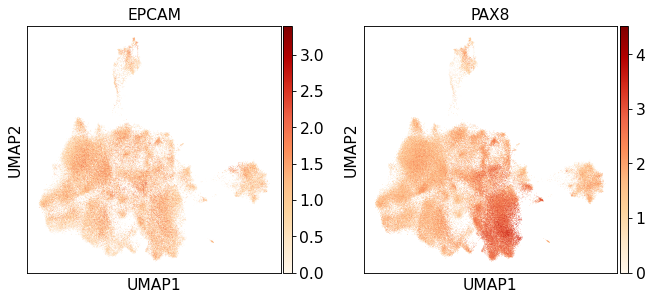

Follicular


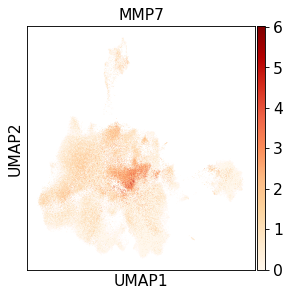

Luteal


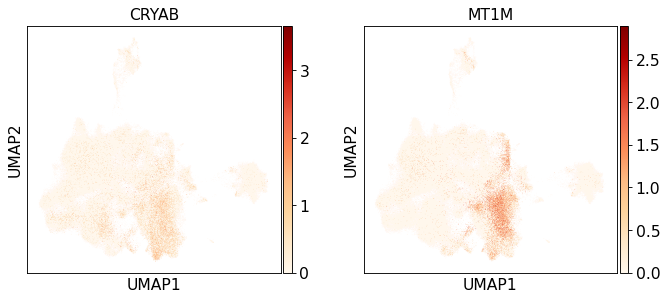

Proliferative


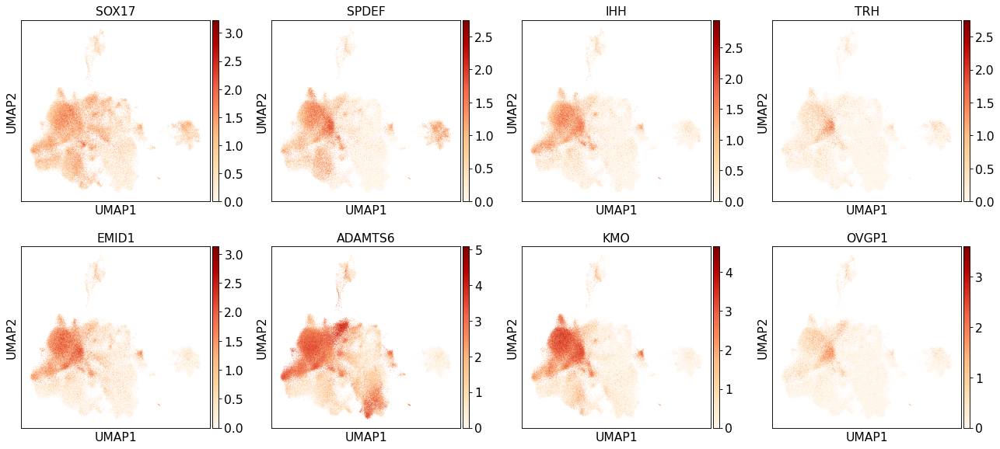

SOX9


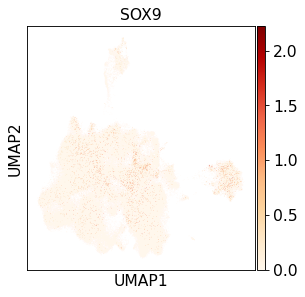

Progenitor SOX9+/CDH2+


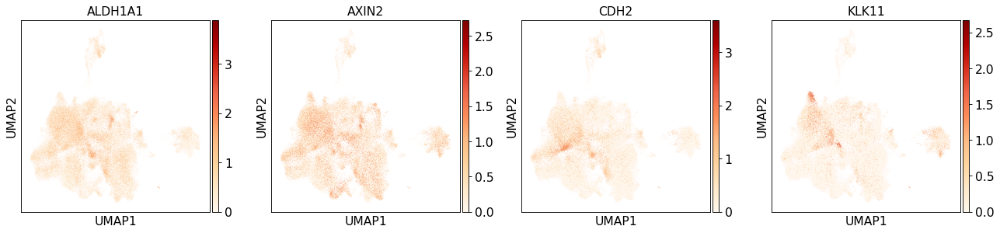

Prolif SOX9+


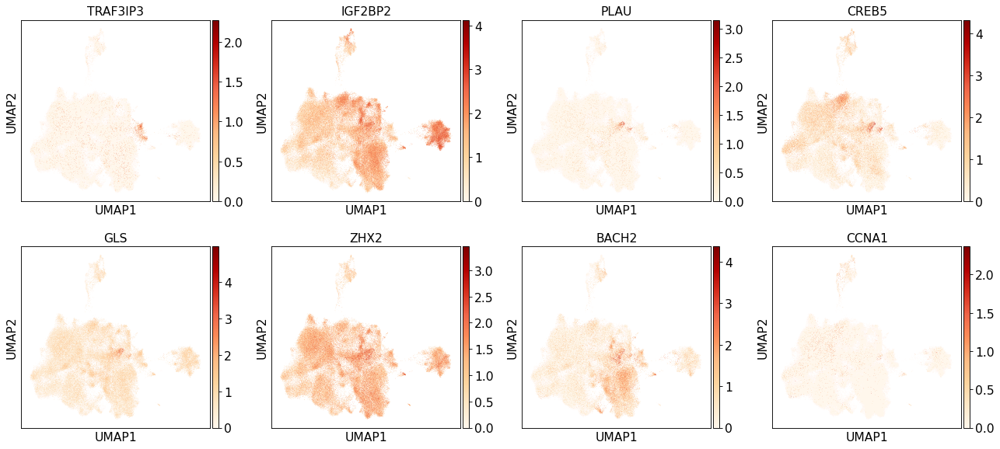

Prolif SOX9+/CDH2+


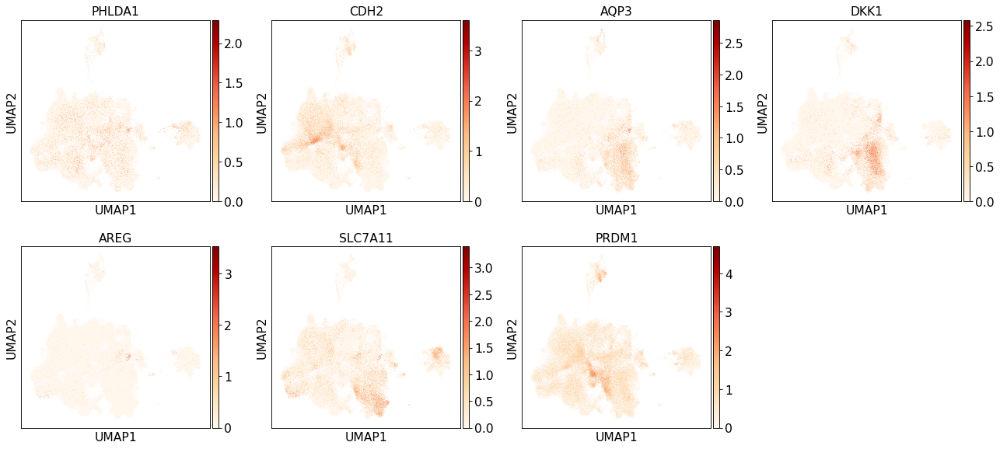

Prolif SOX9+/LGR5+


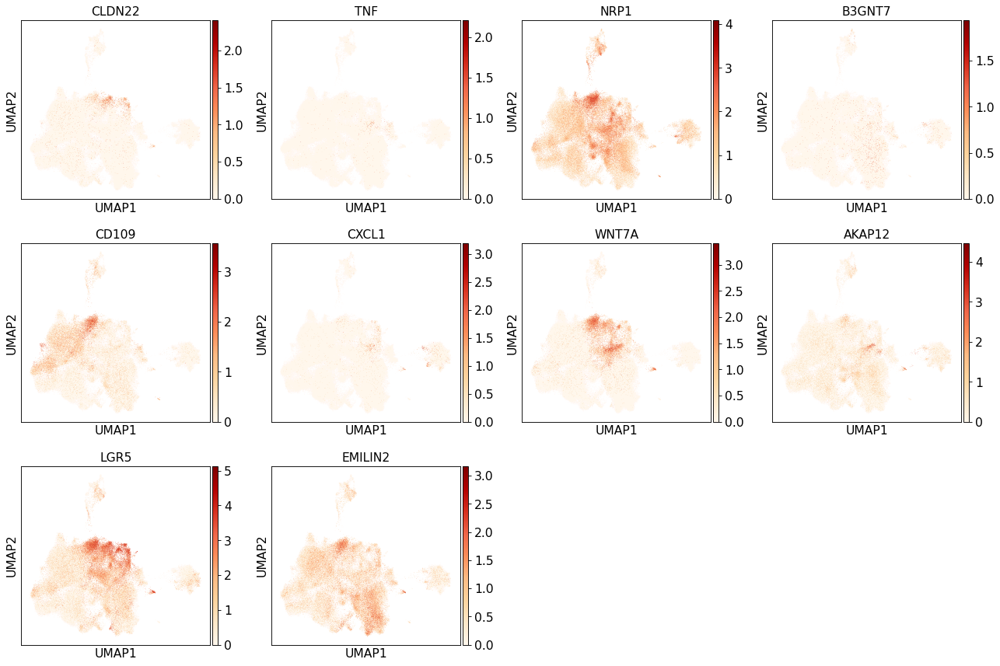

P4-induced


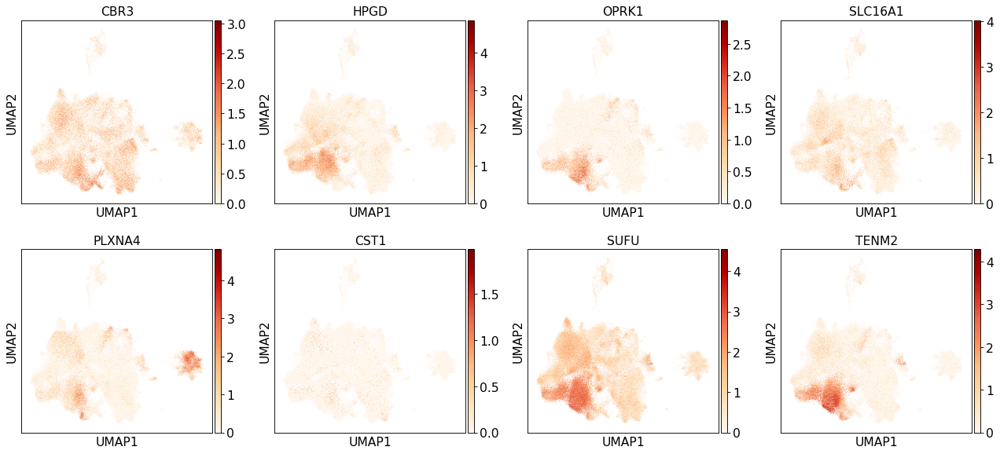

Lumenal


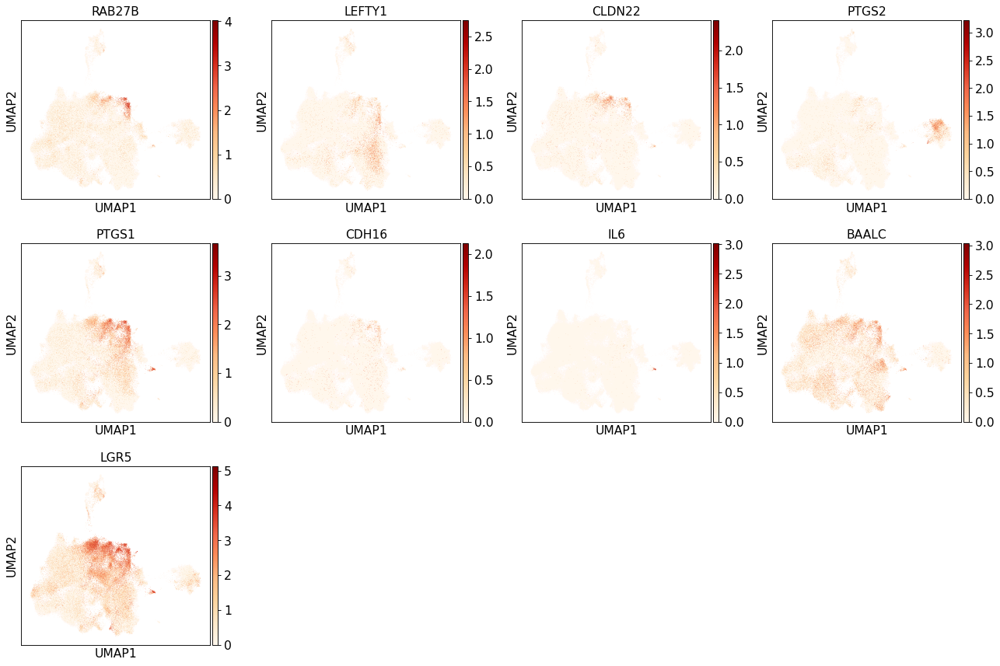

Lumenal late


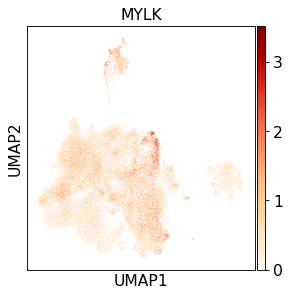

pre-WOI


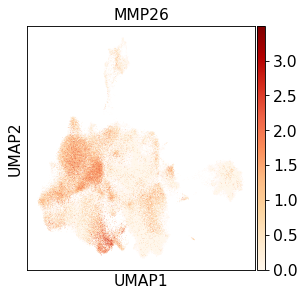

Glandular


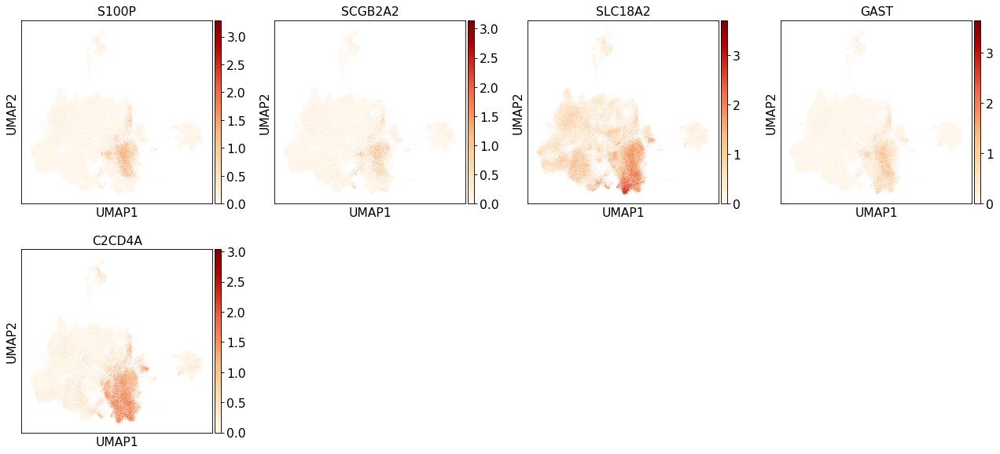

Glandular secretory


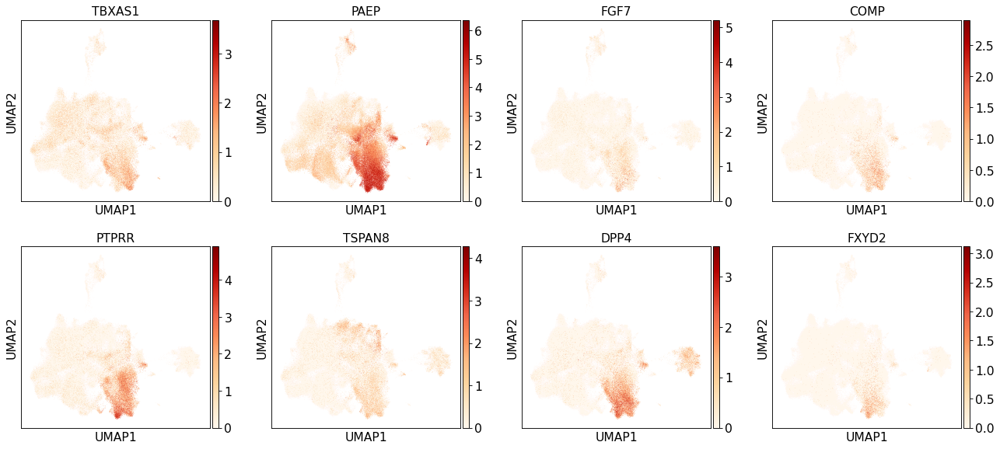

MUC5B+


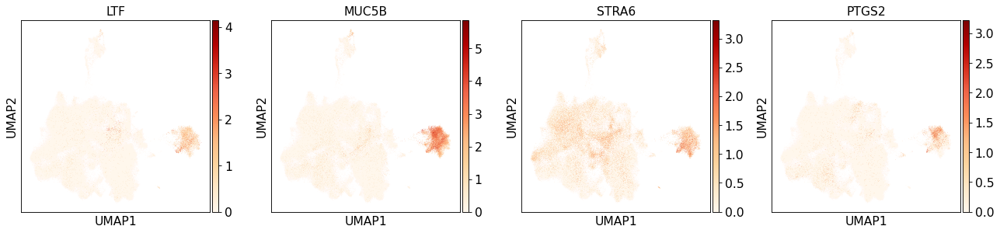

KRT5/TP63


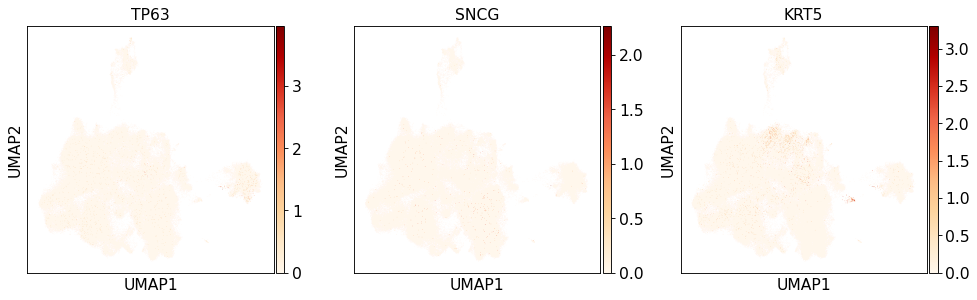

Ciliated Epithelial lineage


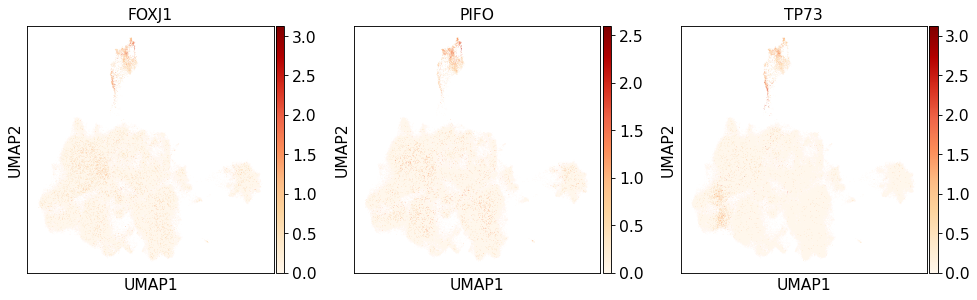

pre-Ciliated


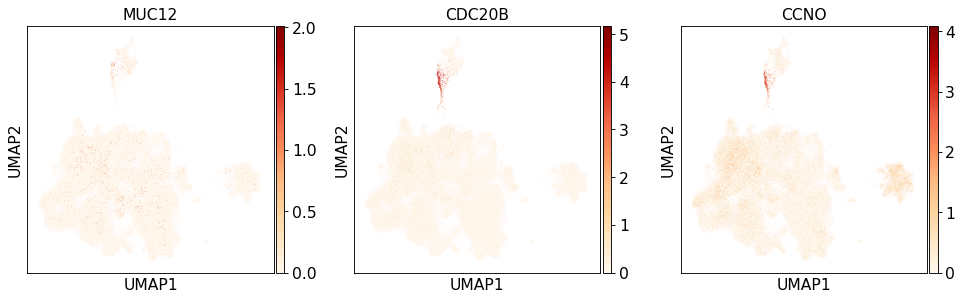

Inflamatory


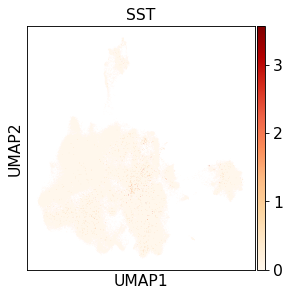

Mesenchymal lineage


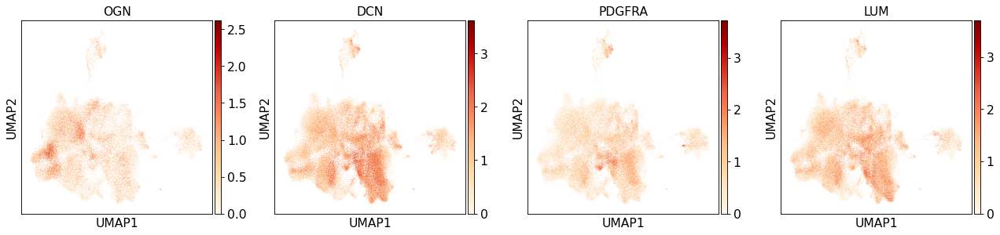

eS


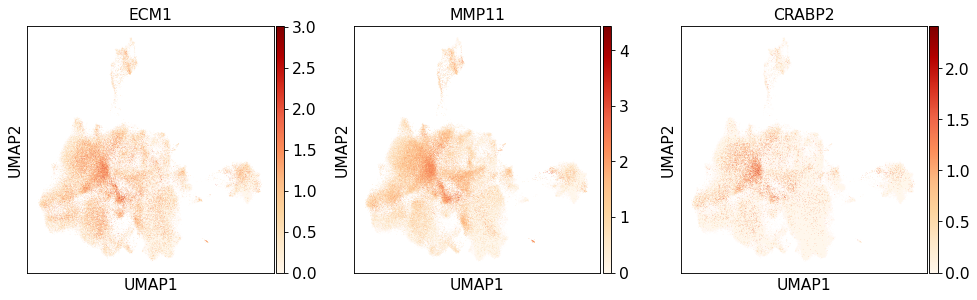

dS


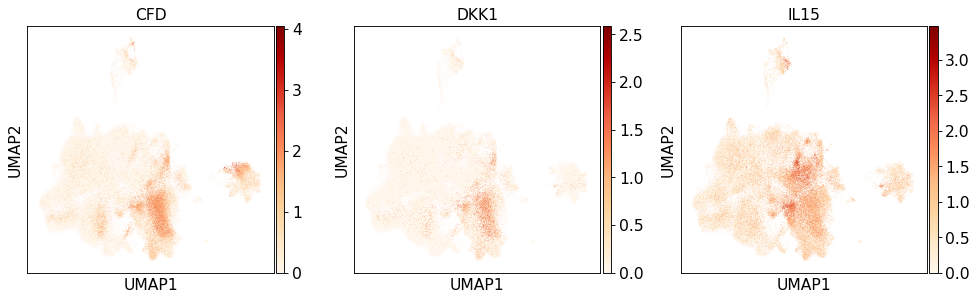

PV lineage


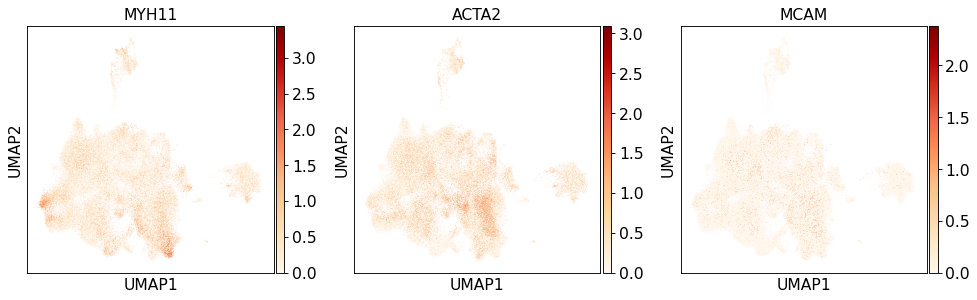

Endothelial


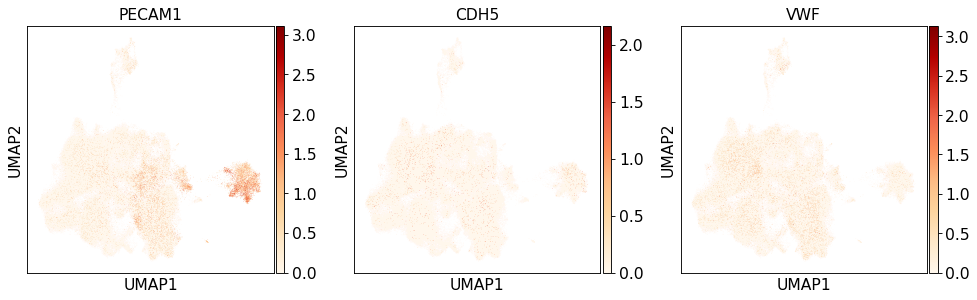

Immune


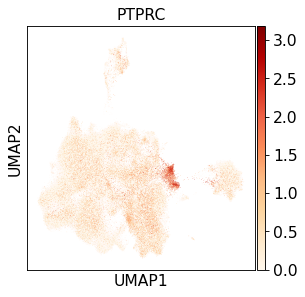

Lymphoid


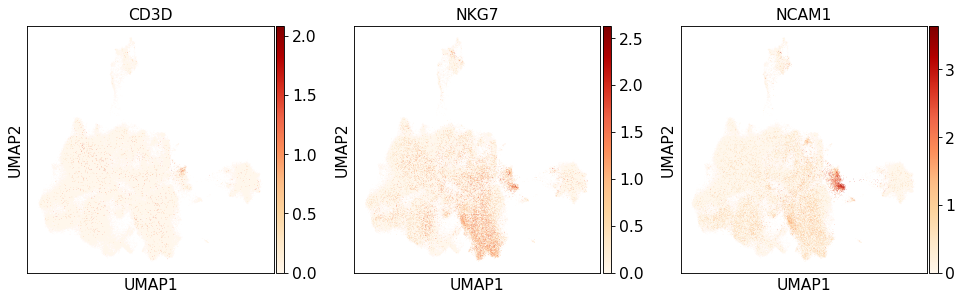

Myeloid


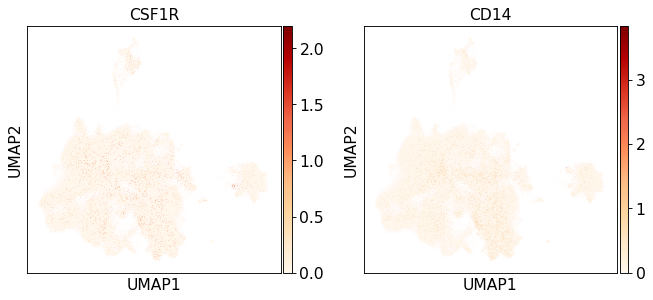

lowQC


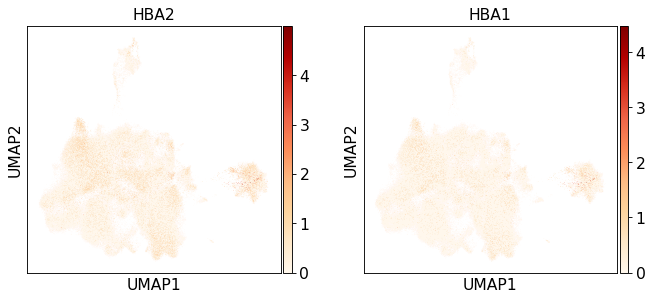

WIF1


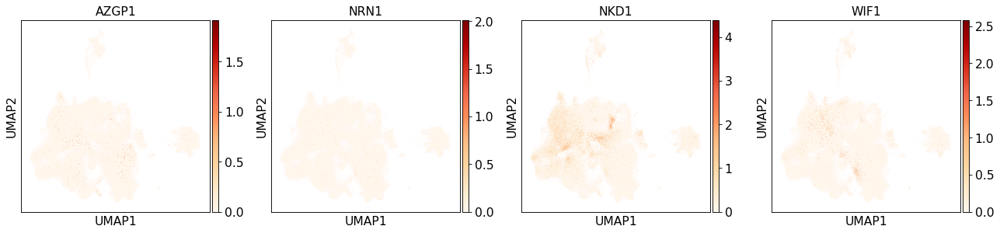

Hormones


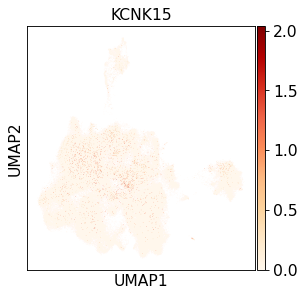

Receptors


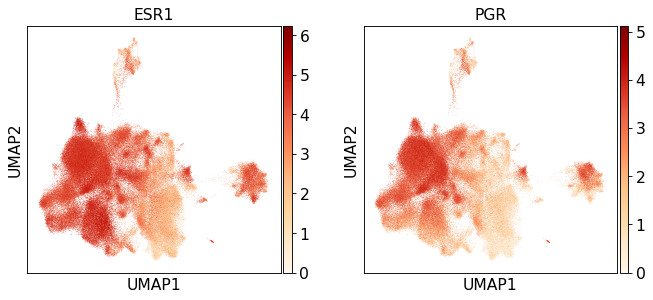

WNT effectors


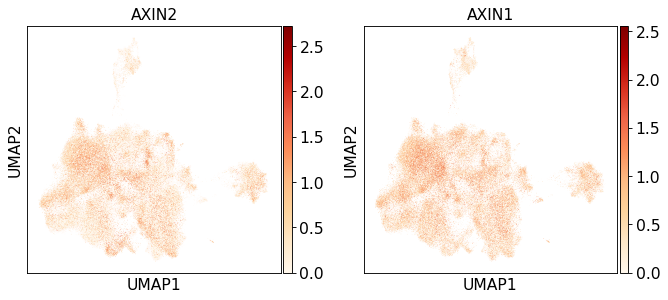

Mesothelial


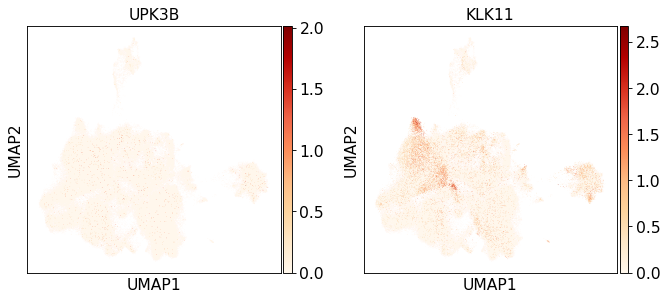

Prostaglandin R


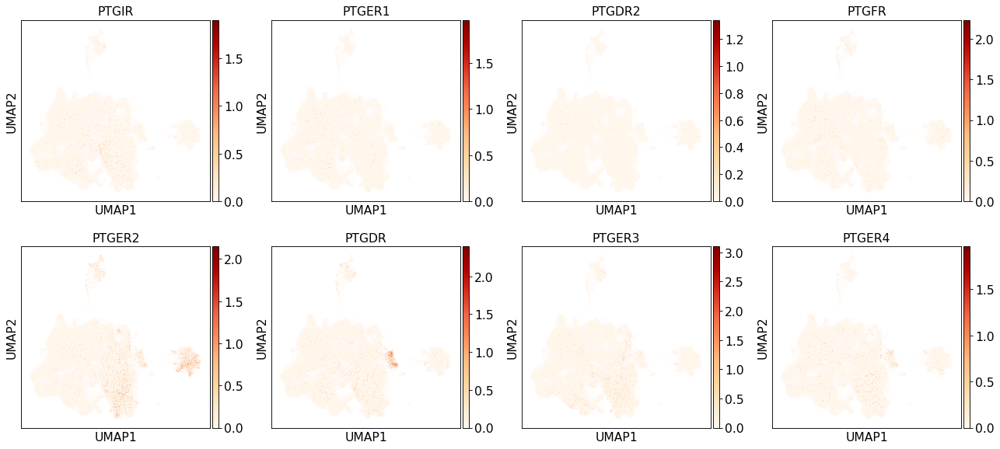

Prostaglandin S


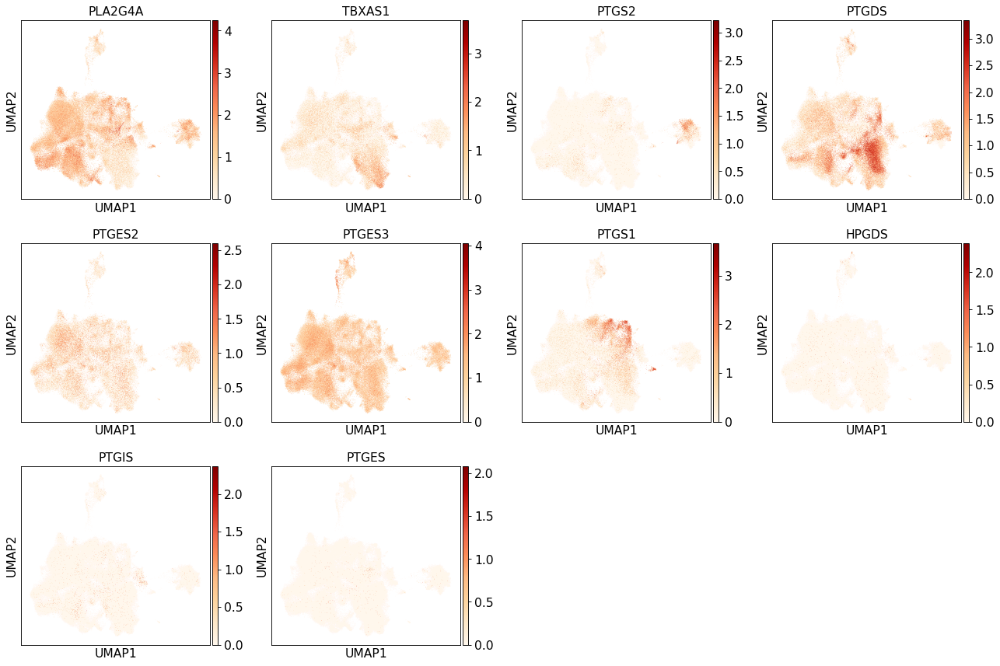

MMPs


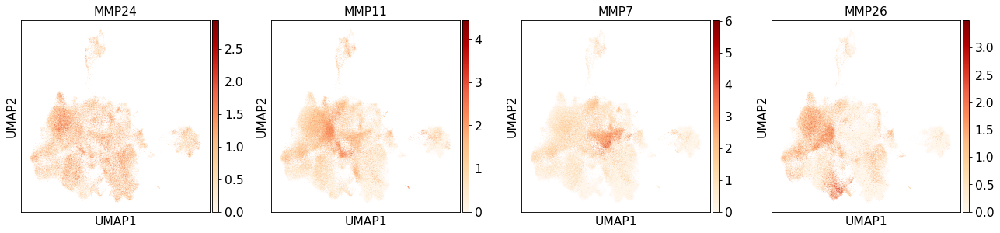

In [22]:
for i in marker_genes.keys():
    print(i)
    sc.pl.umap(adata, color=marker_genes[i], color_map='OrRd', use_raw=False )

### Check global trends

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


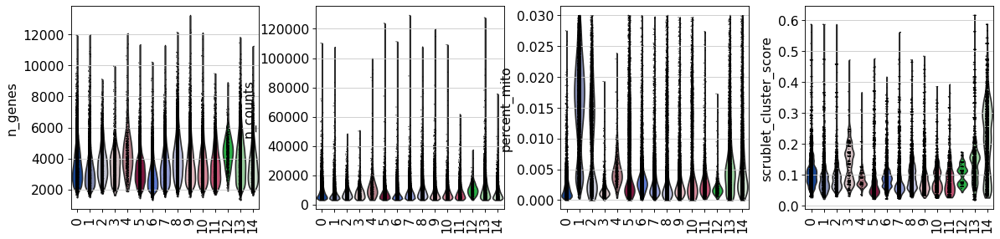

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


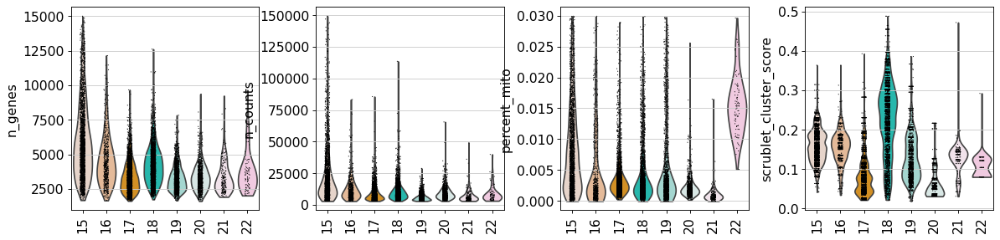

In [23]:
sc.pl.violin(adata[[ float(i) < 15 for i in adata.obs.leiden ]], keys= ['n_genes', 'n_counts', 'percent_mito', 'scrublet_cluster_score'], groupby = 'leiden_R', rotation = 90)
sc.pl.violin(adata[[ float(i) >= 15 for i in adata.obs.leiden ]], keys= ['n_genes', 'n_counts', 'percent_mito', 'scrublet_cluster_score'], groupby = 'leiden_R', rotation = 90)
# sc.pl.violin(adata, keys= ['percent_mito', 'scrublet_score', 'scrublet_cluster_score'], groupby = 'leiden_R', rotation = 90)

# Finding marker genes

Compute a ranking for the highly differential genes in each cluster. Here, we simply rank genes with a t test, which agrees quite well with Seurat.

## All vs rest

In [24]:
# # Compute Mann-Withney test with scanpy
# sc.tl.rank_genes_groups(adata, groupby='leiden', use_raw=False) #, method='logreg'
# # Plot
# sc.pl.rank_genes_groups_dotplot(adata, n_genes=20, dendrogram=False, save='_scanpy.pdf', standard_scale = 'var')

In [25]:
def Barplot(which_var, adata, var='lineage', height=3, color = False):
    plotdata = pd.crosstab(adata.obs[var], adata.obs[which_var], normalize='index') * 100
    if 'category' in plotdata.index.dtype.name:
        plotdata.index.reorder_categories(adata.obs[var].cat.categories[::-1])

    if not color:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False)
    else:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False, color = color)
    ax1.set_title(which_var+' %')
    ax1.set_ylabel(var)
    horiz_offset = 1
    vert_offset = 1.
    ax1 = ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset))
    ax1.figure.savefig(str(sc.settings.figdir)+'/barplot_'+var+'_proportions_'+which_var+'.pdf', bbox_inches='tight',
                       dpi=300, orientation='landscape', format= 'pdf', optimize=True)

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning

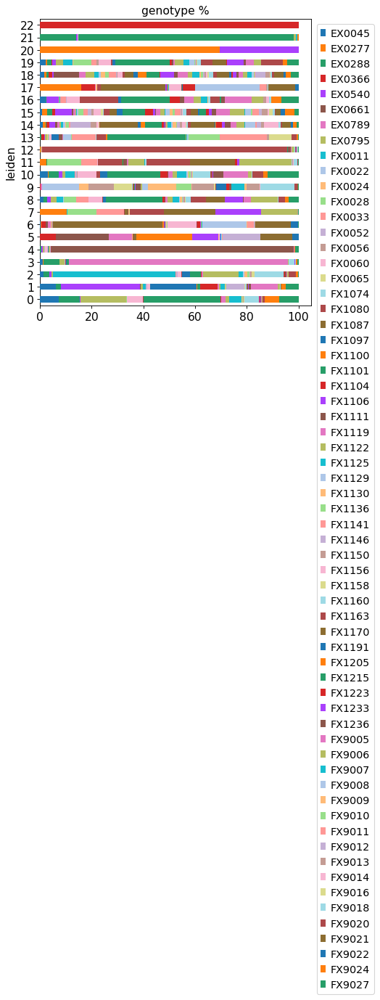

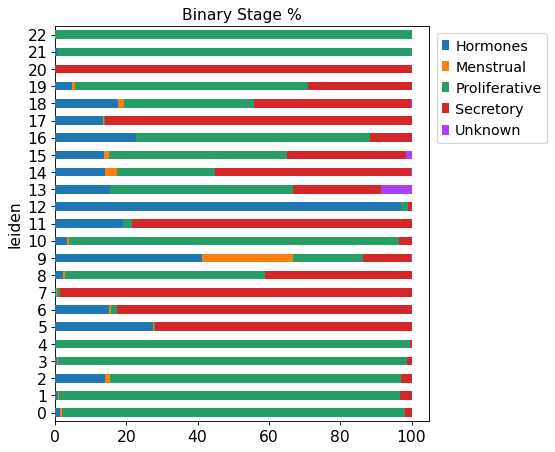

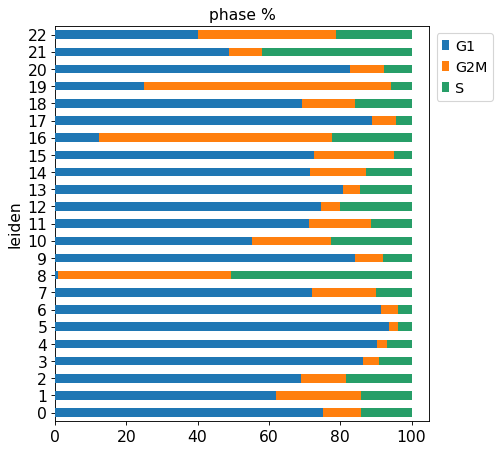

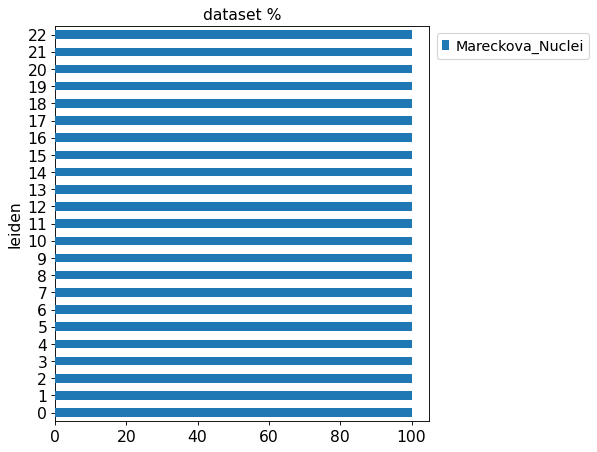

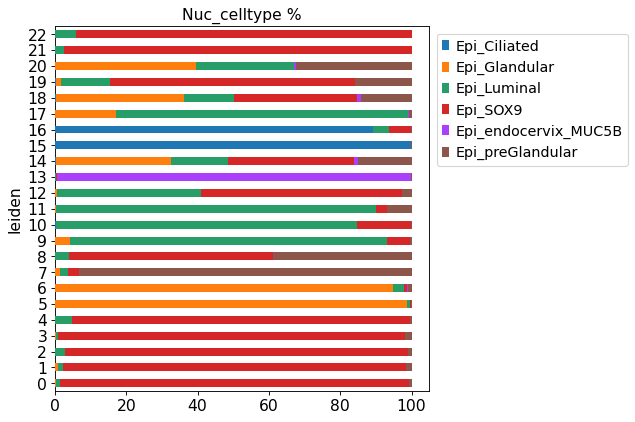

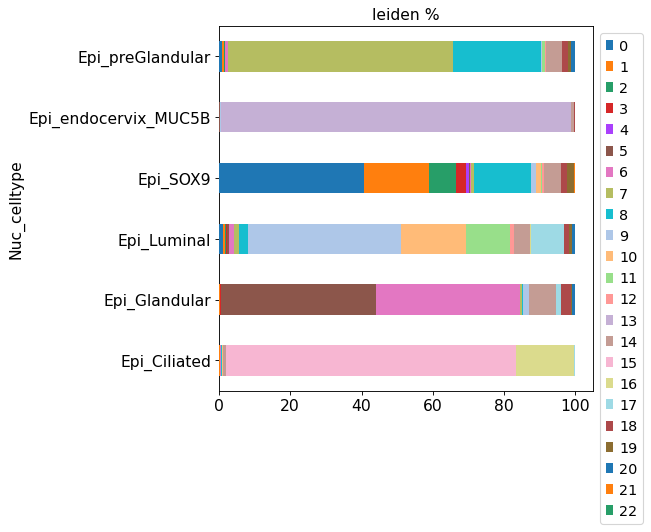

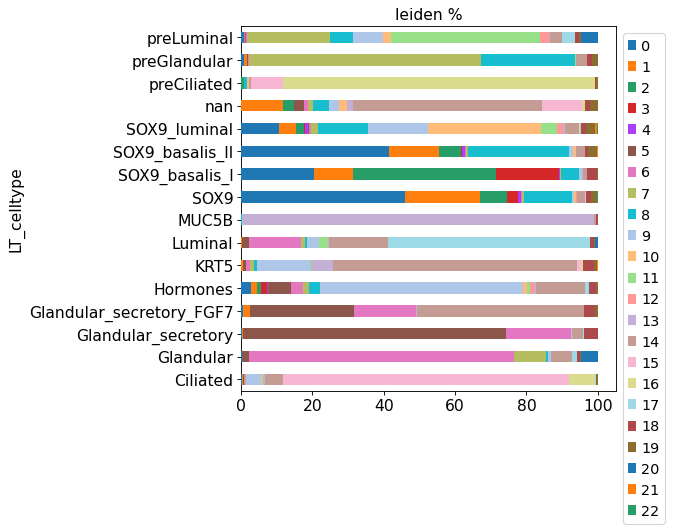

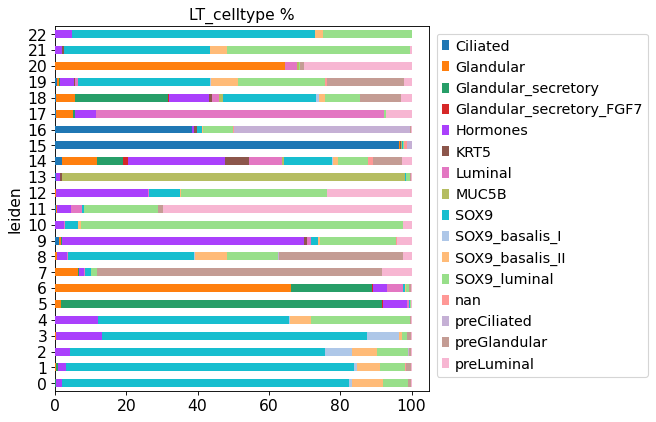

In [26]:
Barplot('genotype', adata, var='leiden', height=6.5)
Barplot('Binary Stage', adata, var='leiden', height=6.5)
Barplot('phase', adata, var='leiden', height=6.5)
Barplot('dataset', adata, var='leiden', height=6.5)
Barplot('Nuc_celltype', adata, var='leiden', height=6)
Barplot('leiden', adata, var='Nuc_celltype', height=6)
Barplot('leiden', adata, var='LT_celltype', height=6)
Barplot('LT_celltype', adata, var='leiden', height=6)

In [27]:
marker_genes_short = {
    'Epithelial lineage': {'EPCAM', 'PAX8'},    
    'MUC5B+':{"MUC5B",},
    'Mesenchymal': {"PDGFRA", 'COL1A1','DCN', 'LUM'}, # 'DCN', 'LUM'
    'PV':{'MYH11', 'ACTA2', "MCAM", 'RGS5'},
    'uSMCs':{'LEFTY2', 'ACTG2', 'ITGA11'},
    'Endothelial': {'PECAM1', 'VWF', 'CDH5'},
    'Immune': {'PTPRC'},
    'Lymphoid': {'CD3D', 'NCAM1' , 'NKG7'},
    'Myeloid': {'CSF1R', 'CD14'},
    'Erythroid': {"HBB", "HBA1"},
    'cycling': {'CDK1', 'MKI67', 'TOP2A'}
}

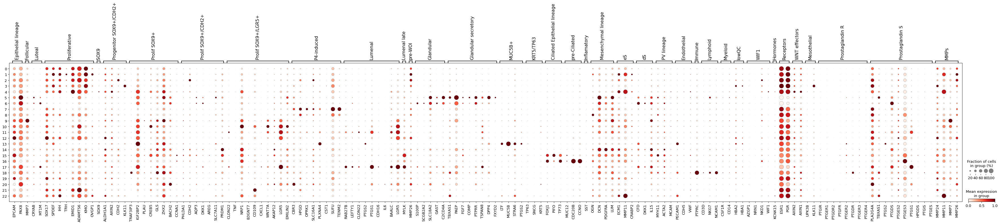

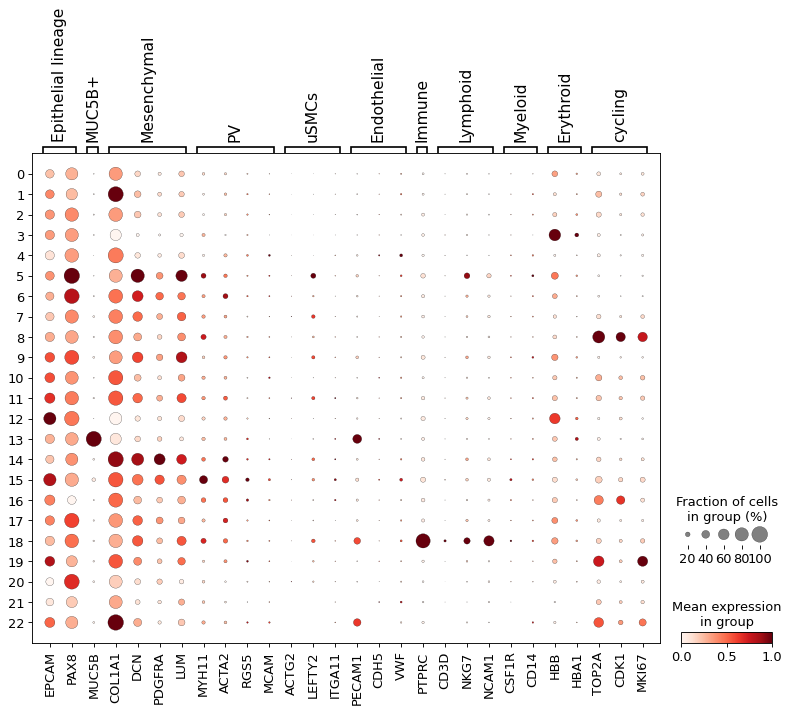

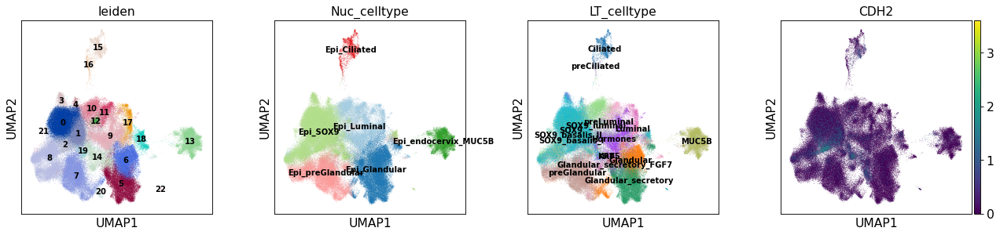

In [28]:
sc.pl.dotplot(adata, marker_genes, groupby='leiden', standard_scale='var', save='MARKERS_leiden.pdf')
sc.pl.dotplot(adata, marker_genes_short, groupby='leiden', standard_scale='var', save='MARKERS-short_leiden.pdf')
sc.pl.umap(adata, color=['leiden', 'Nuc_celltype', 'LT_celltype', 'CDH2'],legend_loc='on data', legend_fontsize=9, save='_leiden.pdf')

... storing 'Nuc_epi_celltype' as categorical
... storing 'Nuc_epi_lineage' as categorical
... storing 'genotype_libraryType' as categorical
... storing 'Group_stage' as categorical
... storing 'genotype_dataset' as categorical


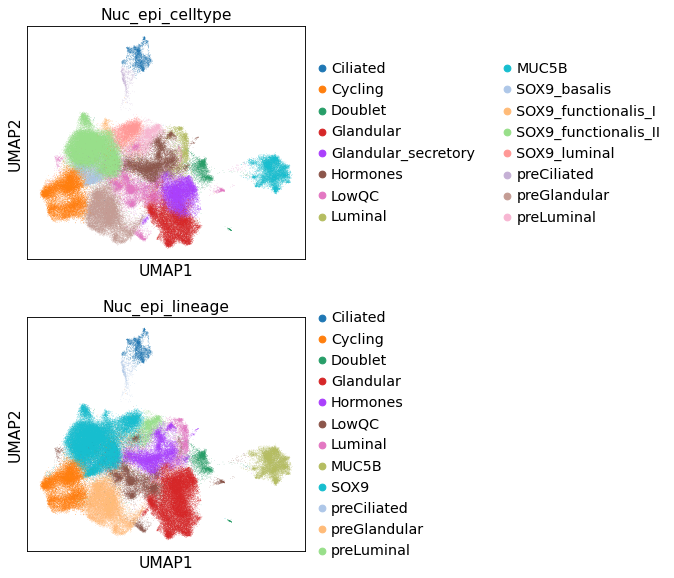

In [37]:
adata.obs['Nuc_epi_celltype'] = adata.obs['leiden'].tolist()
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '0', 'Nuc_epi_celltype'] = 'SOX9_functionalis_II'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '1', 'Nuc_epi_celltype'] = 'SOX9_functionalis_II'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '2', 'Nuc_epi_celltype'] = 'SOX9_basalis'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '3', 'Nuc_epi_celltype'] = 'SOX9_functionalis_II'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '4', 'Nuc_epi_celltype'] = 'SOX9_functionalis_I'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '5', 'Nuc_epi_celltype'] = 'Glandular'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '6', 'Nuc_epi_celltype'] = 'Glandular_secretory'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '7', 'Nuc_epi_celltype'] = 'preGlandular'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '8', 'Nuc_epi_celltype'] = 'Cycling'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '9', 'Nuc_epi_celltype'] = 'Hormones'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '10', 'Nuc_epi_celltype'] = 'SOX9_luminal'

adata.obs.at[adata.obs['Nuc_epi_celltype'] == '11', 'Nuc_epi_celltype'] = 'preLuminal'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '12', 'Nuc_epi_celltype'] = 'LowQC'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '13', 'Nuc_epi_celltype'] = 'MUC5B'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '14', 'Nuc_epi_celltype'] = 'LowQC'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '15', 'Nuc_epi_celltype'] = 'Ciliated'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '16', 'Nuc_epi_celltype'] = 'preCiliated'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '17', 'Nuc_epi_celltype'] = 'Luminal'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '18', 'Nuc_epi_celltype'] = 'Doublet'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '19', 'Nuc_epi_celltype'] = 'LowQC'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '20', 'Nuc_epi_celltype'] = 'LowQC'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '21', 'Nuc_epi_celltype'] = 'LowQC'
adata.obs.at[adata.obs['Nuc_epi_celltype'] == '22', 'Nuc_epi_celltype'] = 'Doublet'





set(adata.obs['Nuc_epi_celltype'])
adata.obs['Nuc_epi_lineage'] = [str(i).split('_', 1)[0] for i in adata.obs['Nuc_epi_celltype'] ]

sc.pl.umap(adata, color=['Nuc_epi_celltype', 'Nuc_epi_lineage'], ncols=1)
# adata.obs['Nuc_epi_celltype'].cat.reorder_categories(['Epithelial', 'Epithelial_MUC5B', 'Epithelial_Glands', 'Epithelial_Ciliated', 'Epithelial_TP63+KRT5+',
#                                                         'Mesothelial', 
#                                                         'Mesenchymal_eS', 'Mesenchymal_dS', 'Mesenchymal_C7', 
#                                                         'PV_STEAP4', 'PV_MYH11', 'uSMCs',
#                                                         'Endothelial', 'Endothelial_LEC', 'Myeloid', 'Lymphoid',
#                                                         'EcO_Mesenchymal',
#                                                         'EcO_Mesenchymal_COL10A1'
#                                                         'EcO_Granulosa', 'EcO_Theca',
#                                                         'LowQC', 'Doublet'], inplace=True)

# sc.pl.umap(adata, color=['Nuc_epi_celltype'])

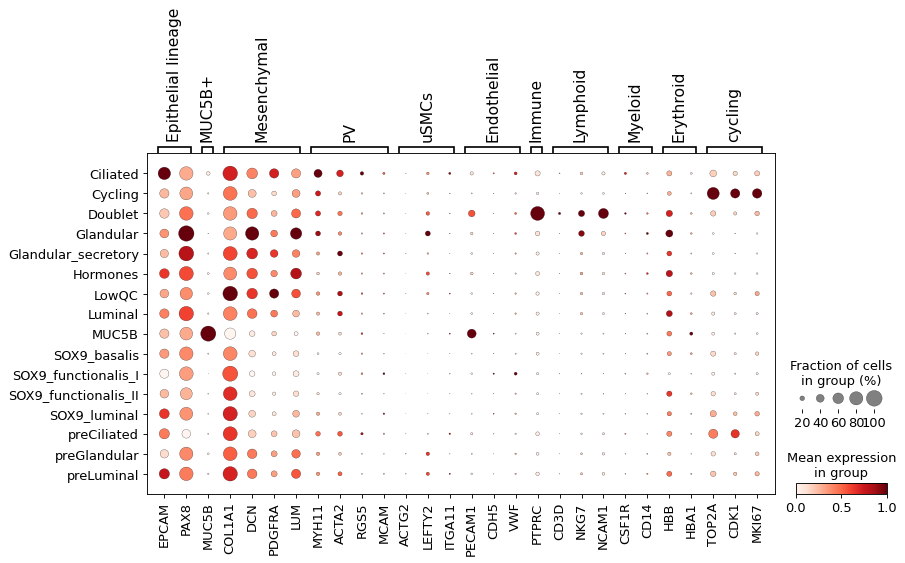

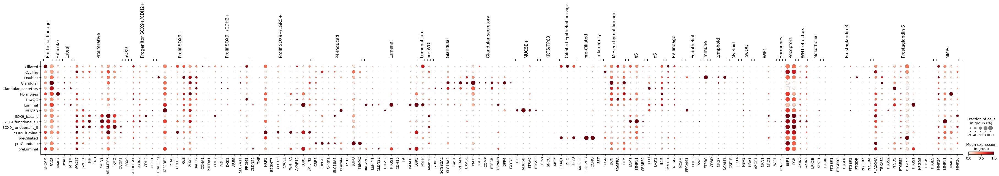

In [38]:
sc.pl.dotplot(adata, marker_genes_short, groupby='Nuc_epi_celltype', standard_scale='var')
sc.pl.dotplot(adata, marker_genes, groupby='Nuc_epi_celltype', standard_scale='var', save='MARKERS_celltype.pdf')

... storing 'leiden_cl' as categorical


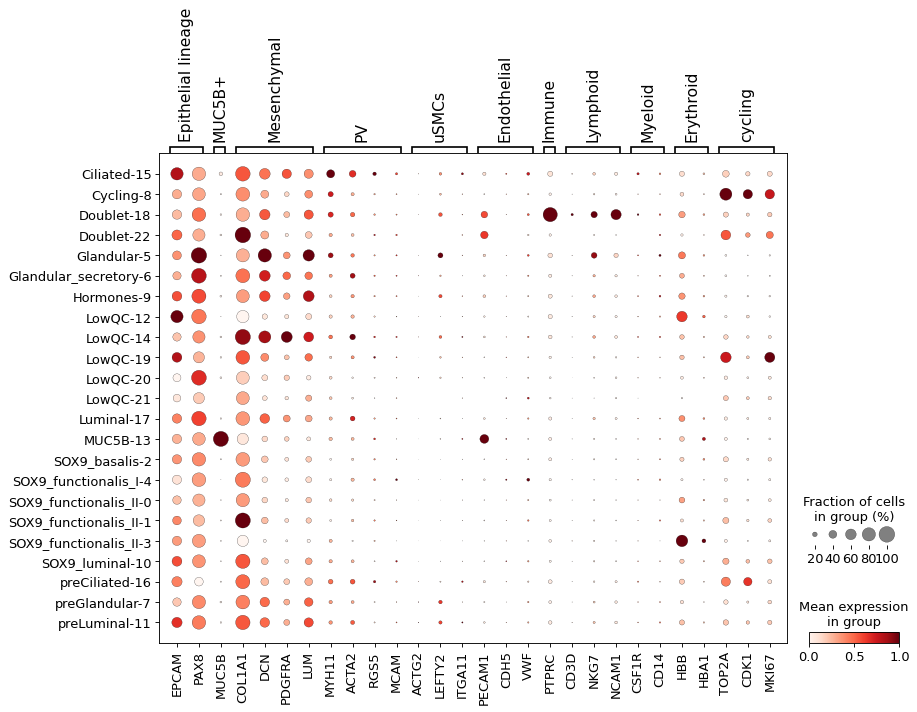

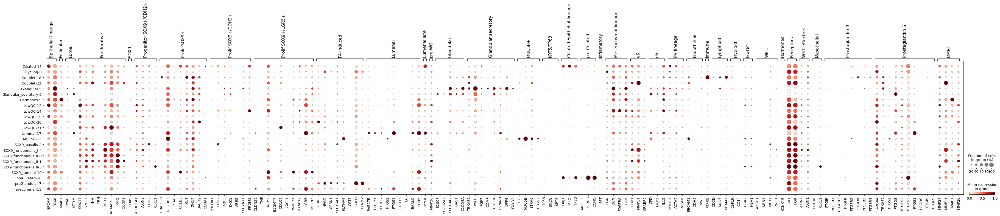

In [39]:
leiden_cl = [a + '-' + b for a, b in zip(adata.obs['Nuc_epi_celltype'], 
                                                                  adata.obs['leiden'])]

adata.obs['leiden_cl'] = leiden_cl


sc.pl.dotplot(adata, marker_genes_short, groupby='leiden_cl', standard_scale='var', save='MARKERS_celltype_leiden.pdf')
sc.pl.dotplot(adata, marker_genes, groupby='leiden_cl', standard_scale='var', save='MARKERS_celltype_leiden.pdf')

In [40]:
# adata.write('x.h5ad')
pd.DataFrame(adata.obs).to_csv('/nfs/team292/lg18/endometriosis/annotations/nuclei_epithelials_endometrium.csv')

In [41]:
sampleID = [a + '-' + b + '_' + c + '-' + d for a, b, c, d in zip(adata.obs['StudyName'], 
                                                                  adata.obs['genotype'], 
                                                                  adata.obs['Treatment'], 
                                                                  adata.obs['library'])]

adata.obs['genotype_libraryType'] = sampleID

sampleID = [a + '-' + b  for a, b in zip(adata.obs['Binary Stage'], 
                                                     adata.obs['Group'])]

adata.obs['Group_stage'] = sampleID

sampleID = [a + '-' + b + '-' + c + '-' + d for a, b, c, d in zip(adata.obs['dataset'], 
                                         adata.obs['Stage'], adata.obs['Group'],
                                                     adata.obs['genotype'])]

adata.obs['genotype_dataset'] = sampleID

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning

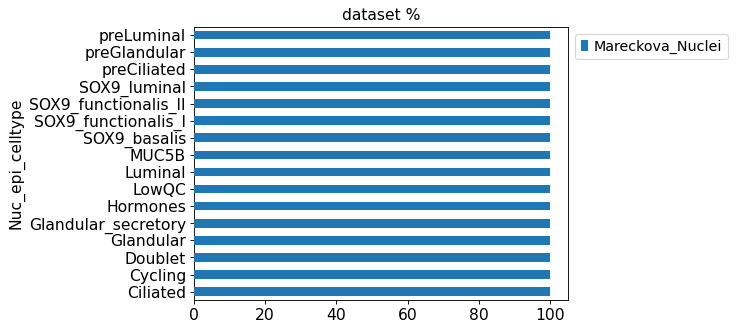

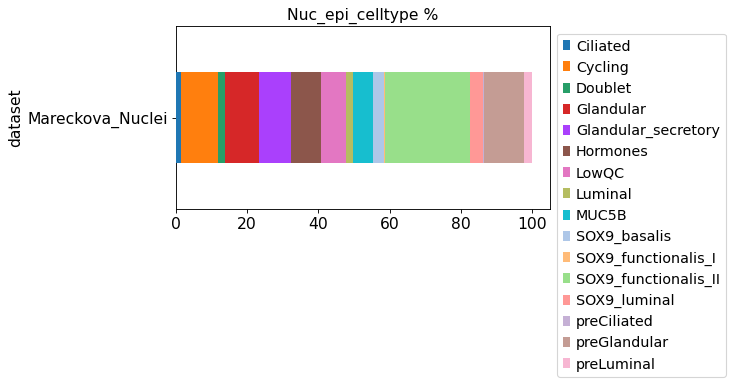

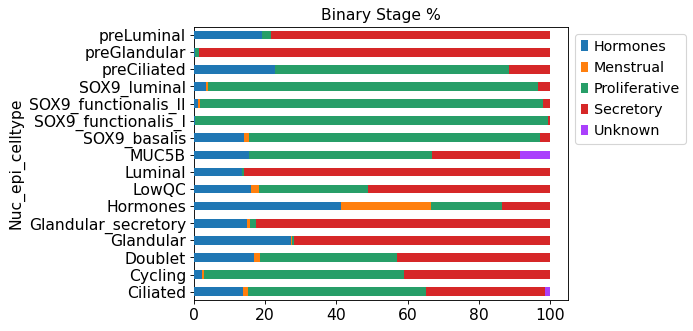

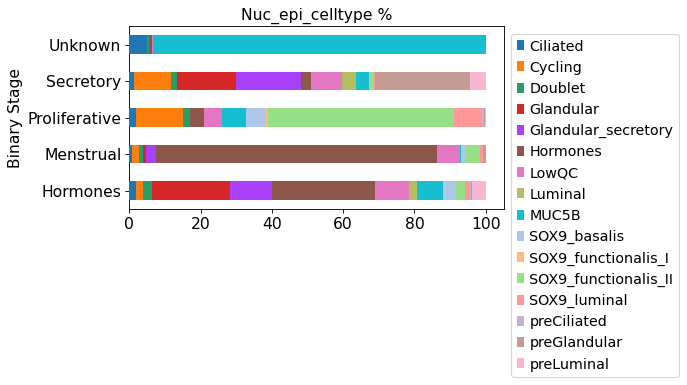

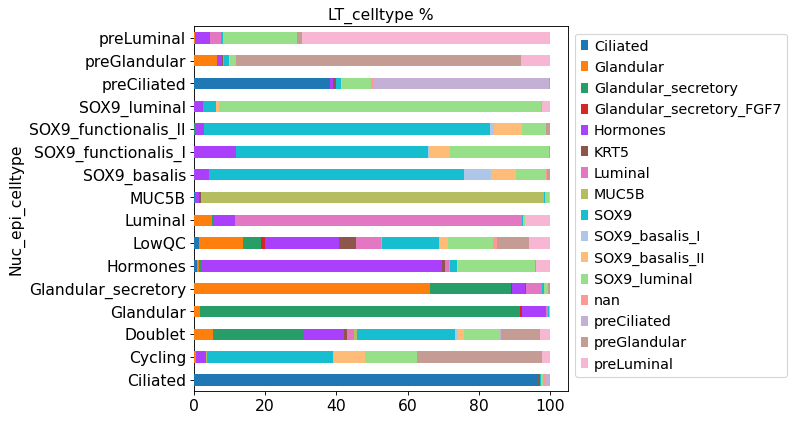

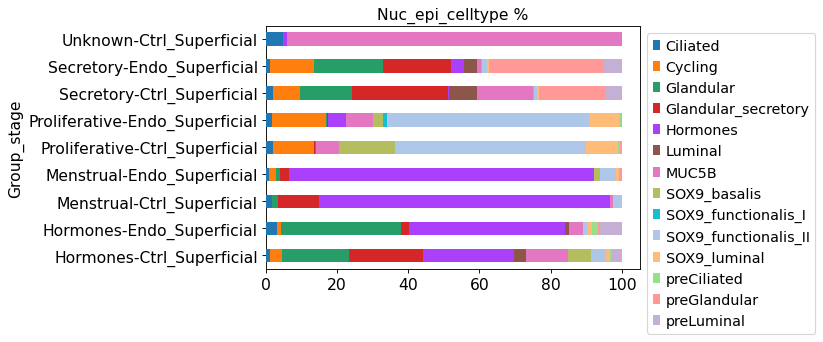

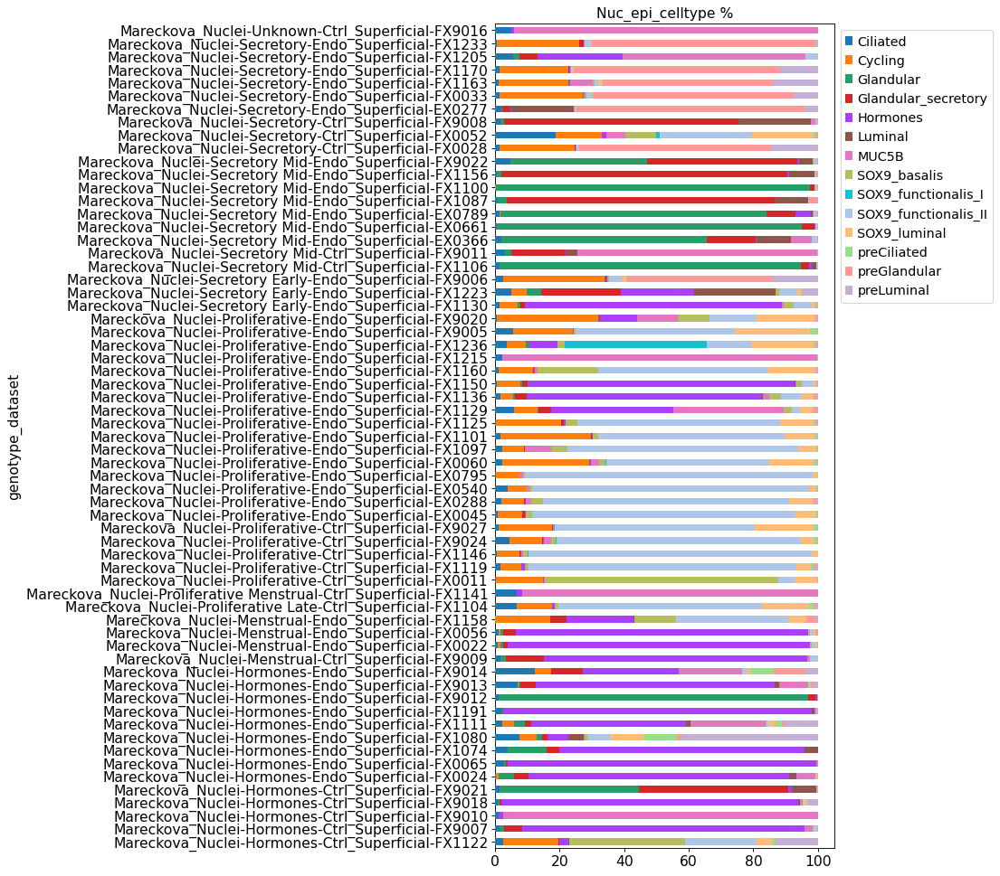

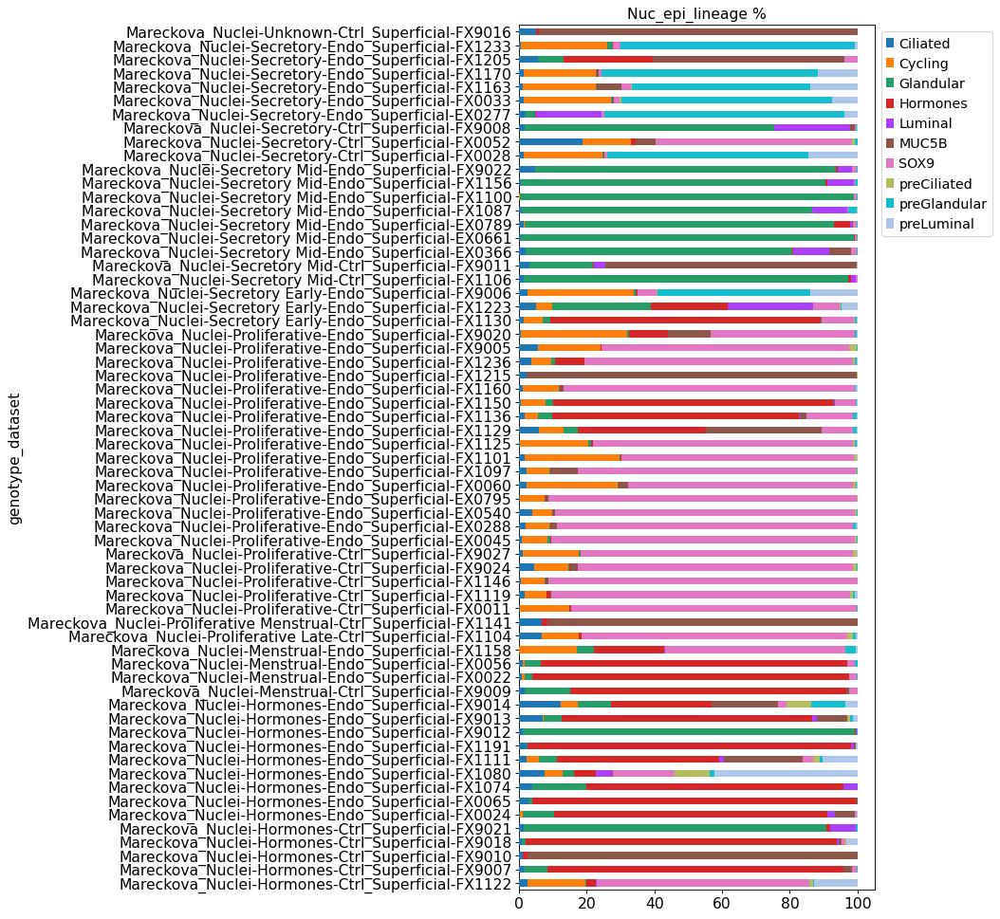

In [42]:
Barplot('dataset', adata, var='Nuc_epi_celltype', height=4.5)
Barplot('Nuc_epi_celltype', adata, var='dataset', height=3)
Barplot('Binary Stage', adata, var='Nuc_epi_celltype', height=4.5)
Barplot('Nuc_epi_celltype', adata, var='Binary Stage', height=3)
Barplot('LT_celltype', adata, var='Nuc_epi_celltype', height=6)

X = adata[[i not in ['Doublet', 'LowQC', 'Other'] for i in adata.obs.Nuc_epi_celltype ]]
Barplot('Nuc_epi_celltype', X, var='Group_stage', height=4)
Barplot('Nuc_epi_celltype', X, var='genotype_dataset', height=15)
Barplot('Nuc_epi_lineage', X, var='genotype_dataset', height=15)

In [43]:
adata.obs['Nuc_epi_celltype'].values.describe()

,counts,freqs
categories,,
Ciliated,2606,0.016054
Cycling,16859,0.103861
Doublet,2867,0.017662
Glandular,15355,0.094595
Glandular_secretory,14854,0.091509
Hormones,13459,0.082915
LowQC,11589,0.071395
Luminal,3146,0.019381
MUC5B,9246,0.056961


# TF-IDF

In [44]:
import anndata
adataDown = adata[[ i in ["G1"] for i in adata.obs.phase ]]
adataDown = sc.pp.subsample(adataDown, fraction=0.25, random_state=0, copy=True) 
sc.pp.filter_cells(adataDown, min_genes=2000)
sc.pp.filter_genes(adataDown, min_cells=5)
print(adataDown.obs['leiden'].value_counts())

### Dowsample the whole dataset UN-EVEN
# adataDown = sc.pp.subsample(XX, fraction=0.25, random_state=0, copy=True) 


### Downsample to the smallest pop size
target_cells = 50

adataDown.obs['cell'] = adataDown.obs.index
adatas = [adataDown[adataDown.obs['leiden'].isin([cl])] for cl in adataDown.obs['leiden'].cat.categories]
# adatas = [adataDown[ adataDown.obs['leiden']==cl ] for cl in adataDown.obs['leiden'].cat.categories]

for dat in adatas:
    if dat.n_obs > target_cells:
        sc.pp.subsample(dat, n_obs=target_cells, random_state=0)
adata_downsampled = adatas[0].concatenate(*adatas[1:])
adataDown = adataDown[[ i in adata_downsampled.obs.cell.tolist() for i in adataDown.obs['cell'] ]]

sc.pp.filter_genes(adataDown, min_cells=20)
print(adataDown.obs['leiden'].value_counts())

del adata_downsampled
del adatas

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
filtered out 927 cells that have less than 2000 genes expressed
filtered out 3202 genes that are detected in less than 5 cells


0     4641
5     3399
6     3116
7     3108
9     2849
13    1771
1     1766
14    1477
2      821
10     813
11     690
17     657
18     444
15     440
3      382
20     184
4      137
19     106
12     104
8       39
21      27
16      21
22       8
Name: leiden, dtype: int64


filtered out 13374 genes that are detected in less than 20 cells
Trying to set attribute `.var` of view, copying.


0     50
1     50
20    50
19    50
18    50
17    50
15    50
14    50
13    50
12    50
11    50
10    50
9     50
7     50
6     50
5     50
4     50
3     50
2     50
8     39
21    27
16    21
22     8
Name: leiden, dtype: int64


In [45]:
import rpy2.rinterface_lib.callbacks
import logging
# Itoliste R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
import anndata2ri
anndata2ri.activate()
%load_ext rpy2.ipython


In [46]:
# This is just to allow moving adata to R without errors
adataDown.X = adataDown.X.toarray()

idx = ['n_genes', 'sample',  'percent_mito', 'n_counts', 'batch', 'S_score', 'G2M_score', 'phase', 
       'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet']
for i in idx:
    del adataDown.obs[i]
    
adataDown.obs['leiden'] = adataDown.obs['leiden'].astype(str)

del adataDown.obsm['X_scVI']
del adataDown.obsm['X_umap']
del adataDown.obsp['connectivities']
del adataDown.obsp['distances']
del adataDown.uns

In [47]:
%%R -i adataDown
adataDown

class: SingleCellExperiment 
dim: 17002 1045 
metadata(0):
assays(1): X
rownames(17002): A1BG A1BG-AS1 ... ZYX ZZEF1
rowData names(165): gene_ids.0 feature_types.0 ... variances_norm
  highly_variable_nbatches
colnames(1045): UA_Endo12296824_TTTAGTCGTTTACACG
  UA_Endo12821484_CCCAACTTCGTGGAAG ... UA_Endo12296824_CATGGATTCCGGTAGC
  UA_Endo11282193_TCATTTGAGACCTCAT
colData names(63): library StudyName ... genotype_dataset cell
reducedDimNames(0):
altExpNames(0):


### By Leiden

In [48]:
%%R -o df_tfIDF -o topgenes_tfIDF

library(Seurat)
library(SoupX)
library(dplyr)
seurat_andata = as.Seurat(adataDown, counts = "X", data = "X")
Idents(seurat_andata) = seurat_andata$leiden


df_tfIDF = quickMarkers(toc = seurat_andata@assays$RNA@counts, clusters = Idents(seurat_andata), N = 500)

df_tfIDF = subset(df_tfIDF, qval <= 0.05)
df_tfIDF$cluster = factor(df_tfIDF$cluster, levels = unique(sort(as.numeric(df_tfIDF$cluster)))  )
topgenes_tfIDF = subset(df_tfIDF, qval <= 0.05) %>%
  group_by(cluster) %>%
  group_map(~ head(.x, 20L)$gene)
names(topgenes_tfIDF) = paste('leiden', levels(df_tfIDF$cluster) )

In [49]:
df_tfIDF.to_csv(str(sc.settings.figdir)+'/TFIDF_leiden.tsv', index=False, sep='\t')

... storing 'genotype_libraryType' as categorical
... storing 'Group_stage' as categorical
... storing 'genotype_dataset' as categorical


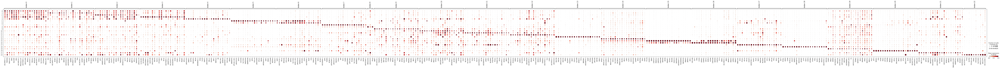

In [50]:
topgenes_tfIDF = dict(zip(topgenes_tfIDF.names, map(list,list(topgenes_tfIDF)))) # this is to convert into a dictionary for plotting
for i in topgenes_tfIDF.keys():
    topgenes_tfIDF[i] = [value for value in topgenes_tfIDF[i] if value in adata.var_names] 
    
sc.pl.dotplot(adata, topgenes_tfIDF, groupby='leiden', standard_scale = 'var', save='TFIDF_leiden.pdf')#topgenes_tfIDF

## By celltype

In [51]:
%%R -o df_tfIDF -o topgenes_tfIDF

library(Seurat)
library(SoupX)
library(dplyr)
seurat_andata = as.Seurat(adataDown, counts = "X", data = "X")
Idents(seurat_andata) = seurat_andata$Nuc_epi_celltype


df_tfIDF = quickMarkers(toc = seurat_andata@assays$RNA@counts, clusters = Idents(seurat_andata), N = 500)

df_tfIDF$cluster = factor(df_tfIDF$cluster, levels = unique(df_tfIDF$cluster)  )
topgenes_tfIDF = subset(df_tfIDF, qval <= 0.05) %>%
  group_by(cluster) %>%
  group_map(~ head(.x, 20L)$gene)
names(topgenes_tfIDF) = unique(df_tfIDF$cluster)

In [52]:
df_tfIDF.to_csv(str(sc.settings.figdir)+'/TFIDF_celltype.tsv', index=False, sep='\t')

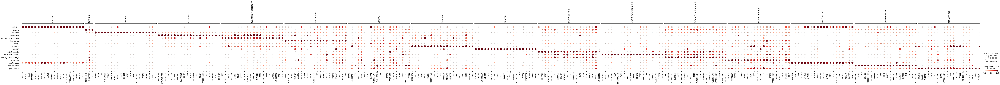

In [53]:
topgenes_tfIDF = dict(zip(topgenes_tfIDF.names, map(list,list(topgenes_tfIDF)))) # this is to convert into a dictionary for plotting
for i in topgenes_tfIDF.keys():
    topgenes_tfIDF[i] = [value for value in topgenes_tfIDF[i] if value in adata.var_names] 

sc.pl.dotplot(adata, topgenes_tfIDF, groupby='Nuc_epi_celltype', standard_scale = 'var', save='TFIDF_celltype.pdf')#topgenes_tfIDF

In [54]:
adata.obs.head()

,n_genes,sample,library,StudyName,SampleID,Lane,Processing,Type,BiopsyType,BiopsyType_II,...,LT_celltype_long,LT_celltype_rm,leiden,leiden_R,Nuc_epi_celltype,Nuc_epi_lineage,leiden_cl,genotype_libraryType,Group_stage,genotype_dataset
UA_Endo12269810_AACACACCACTTCAAG,4733,UA_Endo12269810_FX0033,UA_Endo12269810,Marecckovaa,UA_Endo12269810,43937.0,Frozen,Nuclei,Superficial,NaN,...,e. preGlandular,preGlandular,7,7,preGlandular,preGlandular,preGlandular-7,Marecckovaa-FX0033_None-UA_Endo12269810,Secretory-Endo_Superficial,Mareckova_Nuclei-Secretory-Endo_Superficial-FX...
UA_Endo12061704_GACTGATAGCAGTACG,2887,UA_Endo12061704_FX1163,UA_Endo12061704,Marecckovaa,UA_Endo12061704,43281.0,Frozen,Nuclei,Superficial,NaN,...,e. MUC5B,MUC5B,13,13,MUC5B,MUC5B,MUC5B-13,Marecckovaa-FX1163_None-UA_Endo12061704,Secretory-Endo_Superficial,Mareckova_Nuclei-Secretory-Endo_Superficial-FX...
UA_Endo12061705_GGGTGTCAGGTGGCTA,2324,UA_Endo12061705_FX9009,UA_Endo12061705,Marecckovaa,UA_Endo12061705,43281.0,Frozen,Nuclei,Superficial,NaN,...,e. Hormones,Hormones,9,9,Hormones,Hormones,Hormones-9,Marecckovaa-FX9009_None-UA_Endo12061705,Menstrual-Ctrl_Superficial,Mareckova_Nuclei-Menstrual-Ctrl_Superficial-FX...
UA_Endo12865963_GGGTGAATCCAGCTCT,3002,UA_Endo12865963_FX1087,UA_Endo12865963,Marecckovaa,UA_Endo12865963,44999.0,Frozen,Nuclei,Superficial,NaN,...,e. Glandular,Glandular,14,14,LowQC,LowQC,LowQC-14,Marecckovaa-FX1087_None-UA_Endo12865963,Secretory-Endo_Superficial,Mareckova_Nuclei-Secretory Mid-Endo_Superficia...
UA_Endo10281925_ATGGAGGAGATGACCG,3031,UA_Endo10281925_FX1101,UA_Endo10281925,Marecckovaa,UA_Endo10281925,20.0,Frozen,Nuclei,Superficial,NaN,...,e. SOX9,SOX9,0,0,SOX9_functionalis_II,SOX9,SOX9_functionalis_II-0,Marecckovaa-FX1101_Percoll-UA_Endo10281925,Proliferative-Endo_Superficial,Mareckova_Nuclei-Proliferative-Endo_Superficia...


### Compare WOI glands - ctrl vs endo
#### Mareckova only

In [55]:
set(adata.obs.Nuc_epi_celltype)

{'Ciliated',
 'Cycling',
 'Doublet',
 'Glandular',
 'Glandular_secretory',
 'Hormones',
 'LowQC',
 'Luminal',
 'MUC5B',
 'SOX9_basalis',
 'SOX9_functionalis_I',
 'SOX9_functionalis_II',
 'SOX9_luminal',
 'preCiliated',
 'preGlandular',
 'preLuminal'}

In [57]:
import anndata
# adataDown = adata[[ i in ['Mareckova_Nuclei'] for i in adata.obs.dataset ]]
adataDown = adata[adata[: , 'HBB'].X <= 0.5, :] 
adataDown = adataDown[[ 'Glandular' in i for i in adataDown.obs.Nuc_epi_celltype ]]
adataDown = adataDown[[ 'G1' in i for i in adataDown.obs.phase ]]
adataDown = adataDown[[ i in ['Secretory'] for i in adataDown.obs['Binary Stage'] ]]

sc.pp.filter_cells(adataDown, min_genes=1000)
sc.pp.filter_genes(adataDown, min_cells=5)
# print(adataDown.obs['leiden'].value_counts())

### Dowsample the whole dataset UN-EVEN
# adataDown = sc.pp.subsample(XX, fraction=0.25, random_state=0, copy=True) 


### Downsample to the smallest pop size
target_cells = 1000

adataDown.obs['cell'] = adataDown.obs.index
adatas = [adataDown[adataDown.obs['Group'].isin([cl])] for cl in adataDown.obs['Group'].cat.categories]
# adatas = [adataDown[ adataDown.obs['leiden']==cl ] for cl in adataDown.obs['leiden'].cat.categories]

for dat in adatas:
    if dat.n_obs > target_cells:
        sc.pp.subsample(dat, n_obs=target_cells, random_state=0)
adata_downsampled = adatas[0].concatenate(*adatas[1:])
adataDown = adataDown[[ i in adata_downsampled.obs.cell.tolist() for i in adataDown.obs['cell'] ]]

sc.pp.filter_genes(adataDown, min_cells=10)
print(adataDown.obs['Group'].value_counts())

del adata_downsampled
del adatas

set(adataDown.obs.Nuc_epi_celltype)

Trying to set attribute `.obs` of view, copying.
filtered out 3948 genes that are detected in less than 5 cells
filtered out 9187 genes that are detected in less than 10 cells
Trying to set attribute `.var` of view, copying.


Ctrl_Superficial    1000
Endo_Superficial    1000
Name: Group, dtype: int64


{'Glandular', 'Glandular_secretory', 'preGlandular'}

In [58]:
# This is just to allow moving adata to R without errors
adataDown.X = adataDown.X.toarray()

idx = ['n_genes', 'sample',  'percent_mito', 'n_counts', 'batch', 'S_score', 'G2M_score', 'phase', 
       'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet']
for i in idx:
    del adataDown.obs[i]
    
adataDown.obs['leiden'] = adataDown.obs['leiden'].astype(str)

del adataDown.obsm['X_scVI']
del adataDown.obsm['X_umap']
del adataDown.obsp['connectivities']
del adataDown.obsp['distances']
del adataDown.uns

In [59]:
%%R -i adataDown
adataDown

class: SingleCellExperiment 
dim: 20443 2000 
metadata(0):
assays(1): X
rownames(20443): A1BG A1BG-AS1 ... ZYX ZZEF1
rowData names(165): gene_ids.0 feature_types.0 ... variances_norm
  highly_variable_nbatches
colnames(2000): UA_Endo12296824_ATATCCTAGTAGTCCT
  UA_Endo12269810_ATGAGGGCATGACTAC ... UA_Endo11460962_AGCTCAAAGGACTAAT
  UA_Endo12865961_GGGAGTACATTCTCCG
colData names(63): library StudyName ... genotype_dataset cell
reducedDimNames(0):
altExpNames(0):


In [60]:
%%R -o df_tfIDF -o topgenes_tfIDF

library(Seurat)
library(SoupX)
library(dplyr)
seurat_andata = as.Seurat(adataDown, counts = "X", data = "X")
Idents(seurat_andata) = seurat_andata$Group


df_tfIDF = quickMarkers(toc = seurat_andata@assays$RNA@counts, clusters = Idents(seurat_andata), N = 500)

df_tfIDF$cluster = factor(df_tfIDF$cluster, levels = unique(df_tfIDF$cluster)  )
topgenes_tfIDF = subset(df_tfIDF, qval <= 1) %>%
  group_by(cluster) %>%
  group_map(~ head(.x, 200L)$gene)
names(topgenes_tfIDF) = unique(df_tfIDF$cluster)

In [61]:
df_tfIDF.to_csv('TFIDF_nuclei_WOIepi_endo_vs_ctrl.tsv', index=False, sep='\t')

... storing 'leiden' as categorical


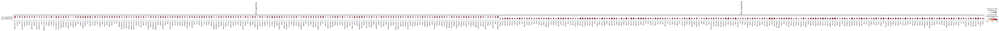

In [62]:
topgenes_tfIDF = dict(zip(topgenes_tfIDF.names, map(list,list(topgenes_tfIDF)))) # this is to convert into a dictionary for plotting
for i in topgenes_tfIDF.keys():
    topgenes_tfIDF[i] = [value for value in topgenes_tfIDF[i] if value in adata.var_names] 
    topgenes_tfIDF[i] = list(set(topgenes_tfIDF[i]))
    

    
sc.pl.dotplot(adataDown, topgenes_tfIDF, groupby='Group', standard_scale = 'var', save='TFIDF_WOIepithelial_Mareckova_epi_celltype.pdf')#topgenes_tfIDF

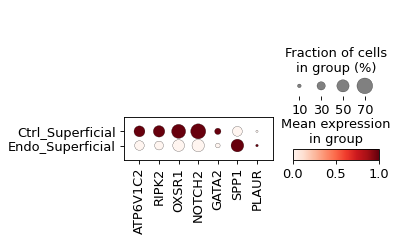

In [63]:
sc.pl.dotplot(adataDown, ['ATP6V1C2', 'RIPK2', 'OXSR1', 'NOTCH2' , 'GATA2', 'SPP1', 'PLAUR'], groupby='Group', standard_scale = 'var', save='TFIDF_WOIepithelial_Mareckova_epi_celltype.pdf')#topgenes_tfIDF

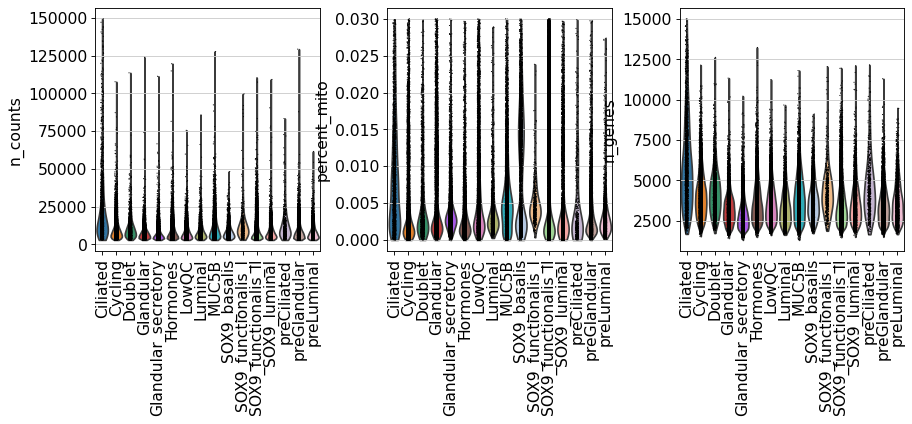

In [64]:
sc.pl.violin(adata, ['n_counts', 'percent_mito', 'n_genes'], groupby='Nuc_epi_celltype', rotation = 90) #hPGCs

In [65]:
adata.write('/nfs/team292/lg18/endometriosis/clustered_objects/nuclei_epithelials.h5ad')